# World Data League 2021

# Stage 3
## Challenge 2: (Literally) Paving the way towards safer cities

### Arcudi Alessio, Padella Alessandro, Pozzan Matteo, Vinci Francesco

### External links and resources:
<ul>
  <li>https://public.roboflow.com/object-detection/pothole/1</li>
  <li>https://github.com/ultralytics/yolov5</li>
  <li>https://www.microsoft.com/en-us/p/hyperlabel/9p1p4866g8z4?activetab=pivot:overviewtab</li>
</ul>

## Introduction

Reduce traffic is one of the central topics every city has to face, the main reasons are the CO2 emissions and the accident risk.
Green means of transport such as bicycles can represent an efficient alternative, but people are discouraged to use them because of the high-risk perception.
Our work aims to detect what are the most dangerous routes of Lisbon and provide some insights to make safer routes for the people using the bicycle.

Starting from the StreetView images, we performed an image segmentation to filter the road in the noised images we had, then we labeled some of them using Hyperlabel to better train the algorithm also on segmented images.
Then we train the YOLOv5 network on the labeled images we produced and we set an index of pavement. 
Finally, we built a heat map of Lisbon with associated each road its condition.

## Development

WORKING DIRECTORY:
- coordinates
- images
- train
  - images
  - labels
- valid
  - images
  - labels
- data.yaml
- train.json
- stage3_challenge2_IBellissimiDiRete4.ipynb
- best.pt

In [1]:
# import the main libraries

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2
from tqdm import tqdm

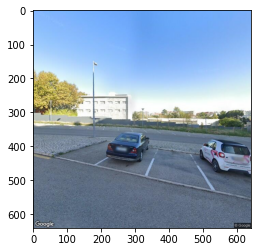

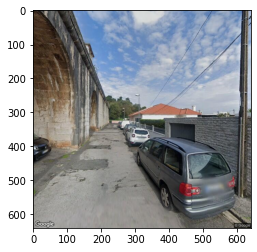

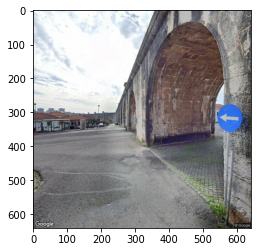

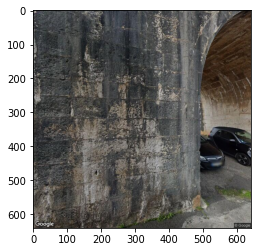

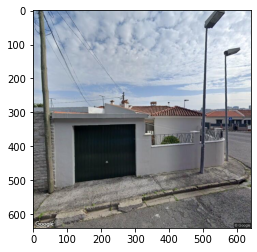

...

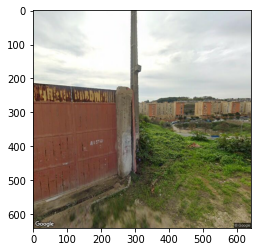

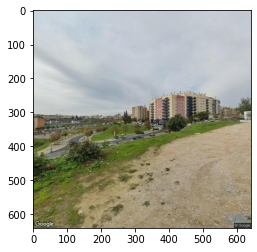

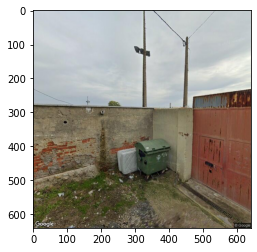

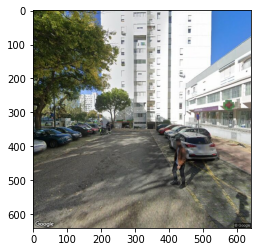

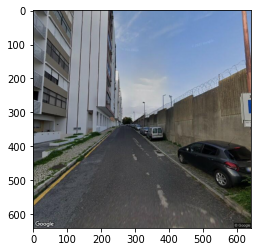

In [2]:
# Start loading some images and visualize them

path_images = os.getcwd()+'/images/'
name_images = sorted(os.listdir(path_images))

for i in name_images[:20]:
    img = cv2.imread(path_images+i)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.figure()
    plt.imshow(img)

### Segmentation of images

First of all we segmentated the images in order to take only the road from them.
<p>This segmentation will help us to detect the potholes in the roads.
Furthermore we can compute the "area" of the road in an easy way.

In [ ]:
# import images

images = dict()
path_images = os.getcwd()+'/images/'
img_size = (713,713)
for i in tqdm(name_images):
    img = cv2.imread(path_images+i)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, dsize=img_size)
    images[i] = img

In [ ]:
#!pip install keras_segmentation

In [ ]:
from keras_segmentation.pretrained import pspnet_101_cityscapes
model_2 = pspnet_101_cityscapes() # load the pretrained model trained on Cityscapes dataset

In [ ]:
# os.mkdir("road_segmentation_images")

In [ ]:
# this requieres a lot of CPU demanding !!

for im in name_images:
    image = images[im].copy()
    image_segm = model_2.predict_segmentation(inp=image)   # segmentation of the images
    image_segm = (image_segm == 0)    # mask of road  0 ----> road
    for i in range (image_segm.shape[0]):
        for j in range(image_segm.shape[1]):
            if not image_segm[i,j]:
                image[i,j] = 255      # white if not road
    plt.imsave(os.getcwd()+'/road_segmentation_images/'+'segmented'+im, image)  # save image

In [ ]:
%reset_selective images  # to save space in RAM 

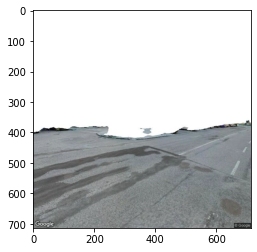

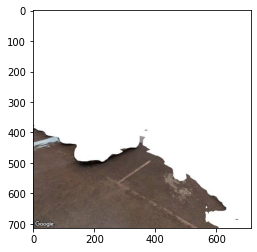

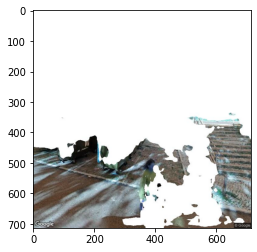

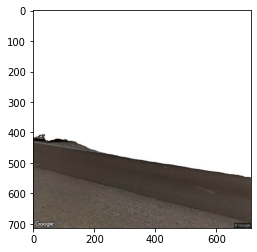

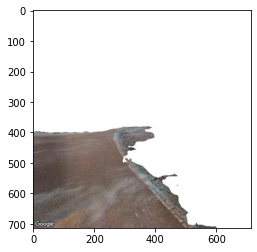

...

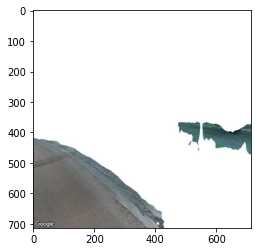

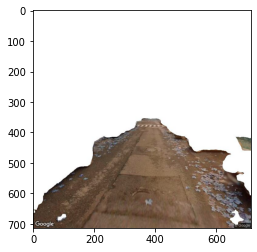

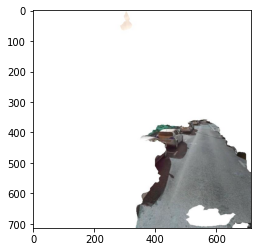

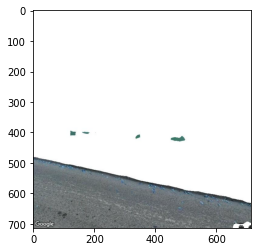

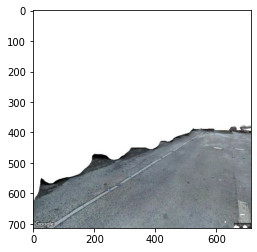

In [3]:
# let's visualize some segmented images

for im in os.listdir(os.getcwd()+'/road_segmentation_images/')[:20]:
    img = cv2.imread(os.getcwd()+'/road_segmentation_images/'+im)
    plt.figure()
    plt.imshow(img)

Now we want to compute the area of the road for each segmented image.

In [4]:
PATH = os.getcwd()+'/road_segmentation_images' 

road_area = dict()
from tqdm import tqdm
for n_img in tqdm(os.listdir(PATH)):
    img = cv2.imread(PATH+'/'+n_img)
    img_white = (img == 255).all(axis=2)   # where is white ? ( where not road )
    road_area[n_img[9:]] = img.shape[0] *img.shape[1] - img_white.sum()  # area of the image - area not road # [9:] in order to cut 'segmented' in the image name   

100%|██████████| 10000/10000 [02:45<00:00, 60.31it/s]


## Images labelling

We takes 3000 of the 10000 images and we recognizes the potholes using HyperLabel.
<p> We would use them to train a Yolov5 model in order to build a model that predicts the potholes in the other images.<p>
<p> HyperLabel gives us for each image a txt file with n rows in wich there are four numbers between 0 and 1: the first two gives us the left below corner and the others the right above corner of the rectangle around the pothole. <p>

In [5]:
import json

#Open the labels from Sense (from Hyperlabel)
'''We recognised manually some potholes on preprocessed images, 
    to train the algorithm also on inputs already preprocessed'''
df = json.load(open('train.json'))   # json file of images and labels
del df['version'], df['project'], df['datasources']

#Delete the rows we do not need transforming the dictionary in a list of lists
df = df['labels']
output = list()
imgs_out = dict()

#Modify the coordinates of the rectangle which comes from Sense to make it readable from YOLOv5

for image in range(len(df)):
    buche = list()
    for buca in df[image]['annotations']['pothole']:
        rect = list()
        rect.append((buca['data']['min'][0] + buca['data']['max'][0]) /2)
        rect.append((buca['data']['min'][1] + buca['data']['max'][1]) /2)
        rect.append(buca['data']['max'][0] - buca['data']['min'][0])
        rect.append(buca['data']['max'][1] - buca['data']['min'][1])
        buche.append(rect)
    imgs_out[df[image]['id']]=buche
       
imgs_out.keys()    

os.mkdir('labels_hyperlabel')
os.chdir('labels_hyperlabel')
for image in imgs_out.keys():        
    file = open(image+'.txt', "w") 
    for buca in imgs_out[image]:
        str_to_add='0 ' + str(buca[0]) + ' ' + str(buca[1]) + ' ' + str(buca[2]) + ' ' + str(buca[3]) + '\n'
        file.write(str_to_add) 
    file.close() 

###### example of Yolov5 label
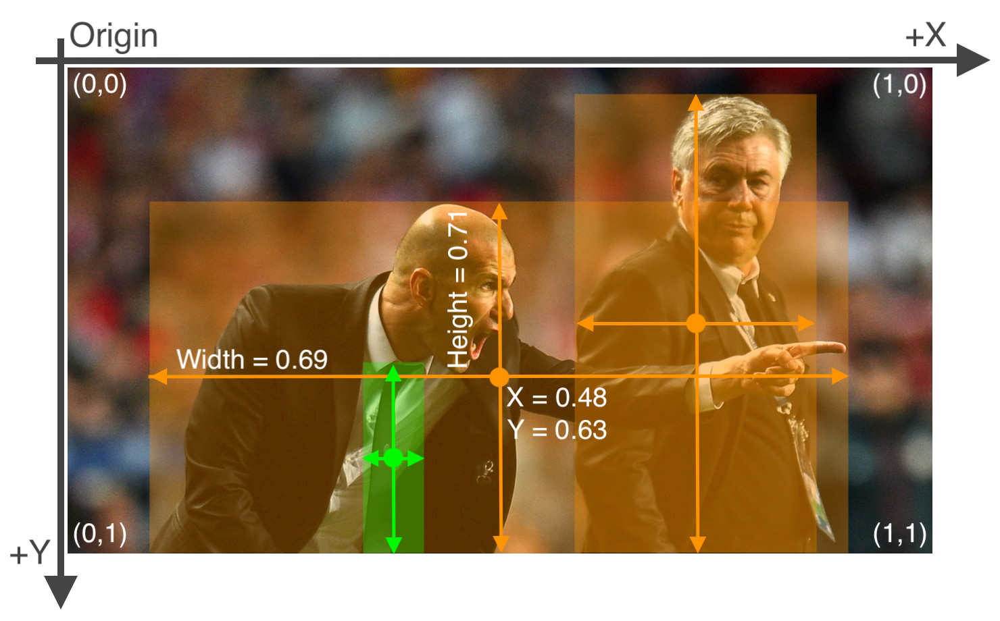
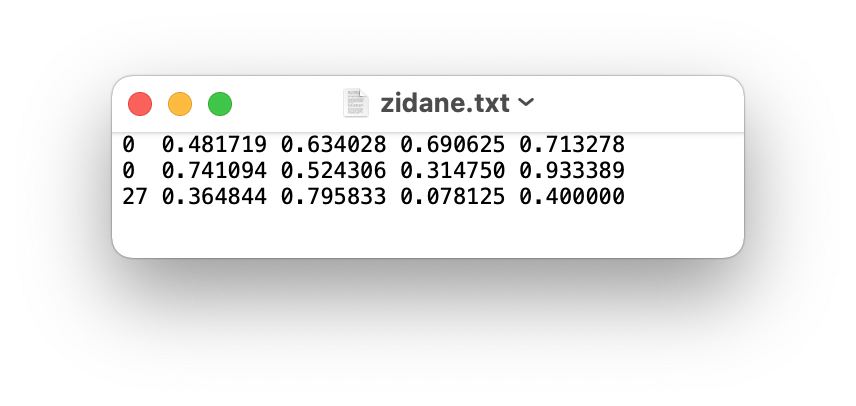

In [6]:
%cd ..

/home/francesco/Documents/wdl/image_set/Competition


## Yolov5 model training

We use a Roboflow notebook (https://colab.research.google.com/drive/1gDZ2xcTOgR39tGGs-EZ6i3RTs16wmzZQ#scrollTo=kJVs_4zEeVbF) in order to train the Yolov5 model using our images.
We train the model in 3000 epochs (as suggested in the notebook).
<p> We download the weights in order to detect the potholes in the other images.

## Potholes detection

Now we use the YOLOv5 model, using the weights computed training the model with the labelled images inusing HyperLabel, to detect potholes in our images. 

In [11]:
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt  # install dependencies

import torch
from IPython.display import Image, clear_output  # to display images

clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Setup complete. Using torch 1.8.1+cu102 CPU


In [14]:
# move cut_images to yolov5 path in order to predict potholes using the model

import shutil
shutil.copytree('/home/francesco/Documents/wdl/image_set/Competition/road_segmentation_images/', os.getcwd()+'/data/images') # move images
shutil.move('/home/francesco/Documents/wdl/image_set/Competition/best.pt', os.getcwd()) # move pretrained weights

'/home/francesco/Documents/wdl/image_set/Competition/yolov5/best.pt'

In [15]:
# best.pt are the weights computed using the model trained with the potholes dataset
# this returns a directory exp in which there are the labeled images and a dircetory labels
# in thedirectory labels there is a file text for each image where there are n rows (one for each pothole) with 4 numbers between 0 and 1 that recognize the potholes

!python3 detect.py --weights best.pt --img 713 --conf 0.4 --save-txt --source data/images/road_segmentation_images

Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.4, device='', exist_ok=False, hide_conf=False, hide_labels=False, img_size=713, iou_thres=0.45, line_thickness=3, name='exp', nosave=False, project='runs/detect', save_conf=False, save_crop=False, save_txt=True, source='data/images/road_segmentation_images', update=False, view_img=False, weights=['best.pt'])
YOLOv5 🚀 v5.0-91-g17b0f71 torch 1.8.1+cu102 CPU

Fusing layers... 
Model Summary: 232 layers, 7246518 parameters, 0 gradients
image 1/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage0.jpg: 736x736 Done. (0.339s)
image 2/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage0angle0.jpg: 736x736 1 pothole, Done. (0.359s)
image 3/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage0angle180.jpg: 736x736 1 pothole, Done. (0.

image 47/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1007angle90.jpg: 736x736 2 potholes, Done. (0.334s)
image 48/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1008.jpg: 736x736 Done. (0.327s)
image 49/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1008angle0.jpg: 736x736 Done. (0.348s)
image 50/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1008angle180.jpg: 736x736 Done. (0.333s)
image 51/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1008angle270.jpg: 736x736 Done. (0.330s)
image 52/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1008angle90.jpg: 736x736 Done. (0.330s)
imag

image 97/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1017angle0.jpg: 736x736 Done. (0.333s)
image 98/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1017angle180.jpg: 736x736 1 pothole, Done. (0.317s)
image 99/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1017angle270.jpg: 736x736 Done. (0.327s)
image 100/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1017angle90.jpg: 736x736 1 pothole, Done. (0.320s)
image 101/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1018.jpg: 736x736 1 pothole, Done. (0.360s)
image 102/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1018angle0.jpg: 736x

image 147/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1026angle90.jpg: 736x736 1 pothole, Done. (0.326s)
image 148/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1027.jpg: 736x736 Done. (0.332s)
image 149/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1027angle0.jpg: 736x736 Done. (0.330s)
image 150/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1027angle180.jpg: 736x736 Done. (0.321s)
image 151/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1027angle270.jpg: 736x736 Done. (0.335s)
image 152/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1027angle90.jpg: 736x736 Done. (0.320s)

image 197/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1036.jpg: 736x736 Done. (0.345s)
image 198/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1036angle0.jpg: 736x736 1 pothole, Done. (0.341s)
image 199/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1036angle180.jpg: 736x736 Done. (0.333s)
image 200/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1036angle270.jpg: 736x736 Done. (0.331s)
image 201/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1036angle90.jpg: 736x736 Done. (0.334s)
image 202/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1037.jpg: 736x736 Done. (0.342s)
image 

image 246/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1045angle180.jpg: 736x736 1 pothole, Done. (0.327s)
image 247/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1045angle270.jpg: 736x736 Done. (0.322s)
image 248/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1045angle90.jpg: 736x736 Done. (0.320s)
image 249/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1046angle0.jpg: 736x736 Done. (0.308s)
image 250/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1046angle180.jpg: 736x736 Done. (0.332s)
image 251/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1046angle270.jpg: 736x736 1 pot

image 295/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1054angle270.jpg: 736x736 1 pothole, Done. (0.332s)
image 296/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1054angle90.jpg: 736x736 Done. (0.325s)
image 297/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1055.jpg: 736x736 Done. (0.332s)
image 298/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1055angle0.jpg: 736x736 1 pothole, Done. (0.324s)
image 299/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1055angle180.jpg: 736x736 1 pothole, Done. (0.330s)
image 300/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1055angle270.jpg:

image 344/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1063angle180.jpg: 736x736 2 potholes, Done. (0.327s)
image 345/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1063angle270.jpg: 736x736 1 pothole, Done. (0.324s)
image 346/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1063angle90.jpg: 736x736 Done. (0.329s)
image 347/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1064.jpg: 736x736 Done. (0.330s)
image 348/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1064angle0.jpg: 736x736 Done. (0.322s)
image 349/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1064angle180.jpg: 736x736 1

image 393/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1072angle90.jpg: 736x736 Done. (0.362s)
image 394/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1073angle0.jpg: 736x736 Done. (0.360s)
image 395/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1073angle180.jpg: 736x736 Done. (0.340s)
image 396/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1073angle270.jpg: 736x736 Done. (0.309s)
image 397/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1073angle90.jpg: 736x736 Done. (0.333s)
image 398/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1074.jpg: 736x736 Done. (0.348s)
image 399/

image 442/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1082angle0.jpg: 736x736 Done. (0.768s)
image 443/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1082angle180.jpg: 736x736 Done. (0.963s)
image 444/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1082angle270.jpg: 736x736 1 pothole, Done. (0.573s)
image 445/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1082angle90.jpg: 736x736 Done. (0.397s)
image 446/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1083.jpg: 736x736 Done. (0.478s)
image 447/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1083angle0.jpg: 736x736 Done. (0.406s)


image 491/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1091angle0.jpg: 736x736 Done. (0.445s)
image 492/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1091angle180.jpg: 736x736 Done. (0.459s)
image 493/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1091angle270.jpg: 736x736 Done. (0.445s)
image 494/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1091angle90.jpg: 736x736 Done. (0.445s)
image 495/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1092.jpg: 736x736 3 potholes, Done. (0.462s)
image 496/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1092angle0.jpg: 736x736 Done. (0.615s)

image 541/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage10angle90.jpg: 736x736 Done. (0.350s)
image 542/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage11.jpg: 736x736 Done. (0.395s)
image 543/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage110.jpg: 736x736 Done. (0.384s)
image 544/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1100.jpg: 736x736 1 pothole, Done. (0.385s)
image 545/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1100angle0.jpg: 736x736 Done. (0.328s)
image 546/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1100angle180.jpg: 736x736 Done. (0.329s)
image 547/10000 /ho

image 590/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1109angle180.jpg: 736x736 1 pothole, Done. (0.371s)
image 591/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1109angle270.jpg: 736x736 Done. (0.337s)
image 592/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1109angle90.jpg: 736x736 Done. (0.348s)
image 593/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage110angle0.jpg: 736x736 Done. (0.350s)
image 594/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage110angle180.jpg: 736x736 Done. (0.331s)
image 595/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage110angle270.jpg: 736x736 Done. (0

image 640/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1118angle270.jpg: 736x736 Done. (0.340s)
image 641/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1118angle90.jpg: 736x736 Done. (0.414s)
image 642/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1119.jpg: 736x736 Done. (0.345s)
image 643/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1119angle0.jpg: 736x736 3 potholes, Done. (0.329s)
image 644/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1119angle180.jpg: 736x736 1 pothole, Done. (0.359s)
image 645/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1119angle270.jpg: 736x736 1

image 689/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1127angle90.jpg: 736x736 Done. (0.397s)
image 690/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1128.jpg: 736x736 Done. (0.398s)
image 691/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1128angle0.jpg: 736x736 Done. (0.404s)
image 692/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1128angle180.jpg: 736x736 Done. (0.420s)
image 693/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1128angle270.jpg: 736x736 Done. (0.445s)
image 694/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1128angle90.jpg: 736x736 Done. (0.456s)
image 695/

image 738/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1137angle0.jpg: 736x736 1 pothole, Done. (0.334s)
image 739/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1137angle180.jpg: 736x736 Done. (0.335s)
image 740/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1137angle270.jpg: 736x736 Done. (0.366s)
image 741/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1137angle90.jpg: 736x736 Done. (0.331s)
image 742/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1138.jpg: 736x736 Done. (0.338s)
image 743/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1138angle0.jpg: 736x736 Done. (0.328s)


image 788/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1146angle270.jpg: 736x736 Done. (0.320s)
image 789/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1146angle90.jpg: 736x736 Done. (0.375s)
image 790/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1147.jpg: 736x736 Done. (0.341s)
image 791/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1147angle0.jpg: 736x736 1 pothole, Done. (0.330s)
image 792/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1147angle180.jpg: 736x736 Done. (0.357s)
image 793/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1147angle270.jpg: 736x736 Done. (0.329s

image 837/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1155angle90.jpg: 736x736 1 pothole, Done. (0.409s)
image 838/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1156.jpg: 736x736 Done. (0.410s)
image 839/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1156angle0.jpg: 736x736 Done. (0.334s)
image 840/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1156angle180.jpg: 736x736 1 pothole, Done. (0.372s)
image 841/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1156angle270.jpg: 736x736 Done. (0.329s)
image 842/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1156angle90.jpg: 736x736 Don

image 886/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1165angle180.jpg: 736x736 Done. (0.337s)
image 887/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1165angle270.jpg: 736x736 Done. (0.338s)
image 888/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1165angle90.jpg: 736x736 Done. (0.346s)
image 889/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1166.jpg: 736x736 Done. (0.384s)
image 890/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1166angle0.jpg: 736x736 1 pothole, Done. (0.342s)
image 891/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1166angle180.jpg: 736x736 Done. (0.439s

image 935/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1174angle270.jpg: 736x736 1 pothole, Done. (0.341s)
image 936/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1174angle90.jpg: 736x736 Done. (0.332s)
image 937/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1175.jpg: 736x736 Done. (0.335s)
image 938/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1175angle0.jpg: 736x736 Done. (0.379s)
image 939/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1175angle180.jpg: 736x736 Done. (0.341s)
image 940/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1175angle270.jpg: 736x736 Done. (0.359s

image 984/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1183angle90.jpg: 736x736 1 pothole, Done. (0.326s)
image 985/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1184.jpg: 736x736 1 pothole, Done. (0.336s)
image 986/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1184angle0.jpg: 736x736 2 potholes, Done. (0.347s)
image 987/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1184angle180.jpg: 736x736 Done. (0.369s)
image 988/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1184angle270.jpg: 736x736 Done. (0.325s)
image 989/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1184angle90.jpg:

image 1033/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1193angle180.jpg: 736x736 Done. (0.337s)
image 1034/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1193angle270.jpg: 736x736 Done. (0.336s)
image 1035/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1193angle90.jpg: 736x736 Done. (0.331s)
image 1036/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1194.jpg: 736x736 Done. (0.356s)
image 1037/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1194angle0.jpg: 736x736 1 pothole, Done. (0.395s)
image 1038/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1194angle180.jpg: 736x736 Done. (

image 1082/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1201angle0.jpg: 736x736 Done. (0.360s)
image 1083/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1201angle180.jpg: 736x736 Done. (0.320s)
image 1084/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1201angle270.jpg: 736x736 Done. (0.324s)
image 1085/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1201angle90.jpg: 736x736 Done. (0.360s)
image 1086/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1202angle0.jpg: 736x736 Done. (0.397s)
image 1087/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1202angle180.jpg: 736x736 Done. (0.340

image 1131/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1211.jpg: 736x736 2 potholes, Done. (0.368s)
image 1132/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1211angle0.jpg: 736x736 Done. (0.358s)
image 1133/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1211angle180.jpg: 736x736 1 pothole, Done. (0.324s)
image 1134/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1211angle270.jpg: 736x736 Done. (0.355s)
image 1135/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1211angle90.jpg: 736x736 Done. (0.354s)
image 1136/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1212.jpg: 736x736 Don

image 1180/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1220angle270.jpg: 736x736 Done. (0.339s)
image 1181/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1220angle90.jpg: 736x736 Done. (0.371s)
image 1182/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1221angle0.jpg: 736x736 Done. (0.325s)
image 1183/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1221angle180.jpg: 736x736 Done. (0.333s)
image 1184/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1221angle270.jpg: 736x736 1 pothole, Done. (0.338s)
image 1185/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1221angle90.jpg: 736x736 

image 1229/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1230.jpg: 736x736 Done. (0.321s)
image 1230/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1230angle0.jpg: 736x736 Done. (0.349s)
image 1231/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1230angle180.jpg: 736x736 Done. (0.330s)
image 1232/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1230angle270.jpg: 736x736 1 pothole, Done. (0.328s)
image 1233/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1230angle90.jpg: 736x736 Done. (0.383s)
image 1234/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1231angle0.jpg: 736x736 1 pothole

image 1278/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage123angle0.jpg: 736x736 Done. (0.322s)
image 1279/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage123angle180.jpg: 736x736 Done. (0.363s)
image 1280/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage123angle270.jpg: 736x736 Done. (0.346s)
image 1281/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage123angle90.jpg: 736x736 Done. (0.329s)
image 1282/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1240.jpg: 736x736 Done. (0.352s)
image 1283/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1240angle0.jpg: 736x736 3 potholes, Done. (0.328

image 1327/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1249angle90.jpg: 736x736 Done. (0.347s)
image 1328/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage124angle0.jpg: 736x736 Done. (0.334s)
image 1329/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage124angle180.jpg: 736x736 Done. (0.385s)
image 1330/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage124angle270.jpg: 736x736 Done. (0.326s)
image 1331/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage124angle90.jpg: 736x736 Done. (0.328s)
image 1332/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1250angle0.jpg: 736x736 Done. (0.331s)
im

image 1376/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage125angle0.jpg: 736x736 Done. (0.375s)
image 1377/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage125angle180.jpg: 736x736 Done. (0.376s)
image 1378/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage125angle270.jpg: 736x736 Done. (0.426s)
image 1379/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage125angle90.jpg: 736x736 Done. (0.374s)
image 1380/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage126.jpg: 736x736 Done. (0.353s)
image 1381/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1260.jpg: 736x736 Done. (0.387s)
image 1382/10000

image 1425/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1269.jpg: 736x736 1 pothole, Done. (0.361s)
image 1426/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1269angle0.jpg: 736x736 Done. (0.385s)
image 1427/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1269angle180.jpg: 736x736 1 pothole, Done. (0.417s)
image 1428/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1269angle270.jpg: 736x736 Done. (0.372s)
image 1429/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1269angle90.jpg: 736x736 Done. (0.365s)
image 1430/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage126angle0.jpg: 736x736

image 1474/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1278angle180.jpg: 736x736 Done. (0.378s)
image 1475/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1278angle270.jpg: 736x736 Done. (0.414s)
image 1476/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1278angle90.jpg: 736x736 1 pothole, Done. (0.411s)
image 1477/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1279.jpg: 736x736 1 pothole, Done. (0.413s)
image 1478/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1279angle0.jpg: 736x736 Done. (0.409s)
image 1479/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1279angle180.jpg: 736x

image 1523/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1287angle270.jpg: 736x736 1 pothole, Done. (0.416s)
image 1524/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1287angle90.jpg: 736x736 1 pothole, Done. (0.405s)
image 1525/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1288angle0.jpg: 736x736 Done. (0.375s)
image 1526/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1288angle180.jpg: 736x736 Done. (0.445s)
image 1527/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1288angle270.jpg: 736x736 Done. (0.374s)
image 1528/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1288angle90.jp

image 1572/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1297angle270.jpg: 736x736 Done. (0.401s)
image 1573/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1297angle90.jpg: 736x736 Done. (0.383s)
image 1574/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1298.jpg: 736x736 Done. (0.390s)
image 1575/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1298angle0.jpg: 736x736 Done. (0.394s)
image 1576/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1298angle180.jpg: 736x736 Done. (0.370s)
image 1577/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1298angle270.jpg: 736x736 Done. (0.370s)
ima

image 1621/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1305angle270.jpg: 736x736 1 pothole, Done. (0.388s)
image 1622/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1305angle90.jpg: 736x736 Done. (0.398s)
image 1623/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1306.jpg: 736x736 1 pothole, Done. (0.434s)
image 1624/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1306angle0.jpg: 736x736 1 pothole, Done. (0.385s)
image 1625/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1306angle180.jpg: 736x736 Done. (0.406s)
image 1626/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1306angle27

image 1670/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1315.jpg: 736x736 Done. (0.408s)
image 1671/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1315angle0.jpg: 736x736 Done. (0.404s)
image 1672/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1315angle180.jpg: 736x736 Done. (0.456s)
image 1673/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1315angle270.jpg: 736x736 1 pothole, Done. (0.438s)
image 1674/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1315angle90.jpg: 736x736 Done. (0.374s)
image 1675/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1316.jpg: 736x736 Done. (0.409s)


image 1719/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1323angle90.jpg: 736x736 Done. (0.381s)
image 1720/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1324.jpg: 736x736 Done. (0.379s)
image 1721/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1324angle0.jpg: 736x736 2 potholes, Done. (0.375s)
image 1722/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1324angle180.jpg: 736x736 2 potholes, Done. (0.374s)
image 1723/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1324angle270.jpg: 736x736 1 pothole, Done. (0.380s)
image 1724/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1324angle

image 1768/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1333angle180.jpg: 736x736 1 pothole, Done. (0.420s)
image 1769/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1333angle270.jpg: 736x736 Done. (0.421s)
image 1770/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1333angle90.jpg: 736x736 Done. (0.406s)
image 1771/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1334angle0.jpg: 736x736 Done. (0.401s)
image 1772/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1334angle180.jpg: 736x736 Done. (0.382s)
image 1773/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1334angle270.jpg: 736x736

image 1817/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1344angle180.jpg: 736x736 1 pothole, Done. (0.386s)
image 1818/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1344angle270.jpg: 736x736 1 pothole, Done. (0.404s)
image 1819/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1344angle90.jpg: 736x736 2 potholes, Done. (0.412s)
image 1820/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1345angle0.jpg: 736x736 Done. (0.425s)
image 1821/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1345angle180.jpg: 736x736 1 pothole, Done. (0.420s)
image 1822/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segme

image 1865/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1355angle0.jpg: 736x736 1 pothole, Done. (0.419s)
image 1866/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1355angle180.jpg: 736x736 Done. (0.417s)
image 1867/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1355angle270.jpg: 736x736 Done. (0.413s)
image 1868/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1355angle90.jpg: 736x736 Done. (0.399s)
image 1869/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1356angle0.jpg: 736x736 Done. (0.378s)
image 1870/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1356angle180.jpg: 736x736 D

image 1914/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1366angle0.jpg: 736x736 Done. (0.369s)
image 1915/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1366angle180.jpg: 736x736 Done. (0.367s)
image 1916/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1366angle270.jpg: 736x736 Done. (0.390s)
image 1917/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1366angle90.jpg: 736x736 Done. (0.389s)
image 1918/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1367angle0.jpg: 736x736 Done. (0.410s)
image 1919/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1367angle180.jpg: 736x736 Done. (0.382

image 1963/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1377angle0.jpg: 736x736 Done. (0.388s)
image 1964/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1377angle180.jpg: 736x736 Done. (0.397s)
image 1965/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1377angle270.jpg: 736x736 Done. (0.369s)
image 1966/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1377angle90.jpg: 736x736 Done. (0.396s)
image 1967/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1378angle0.jpg: 736x736 Done. (0.387s)
image 1968/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1378angle180.jpg: 736x736 Done. (0.398

image 2012/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1388angle0.jpg: 736x736 Done. (0.391s)
image 2013/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1388angle180.jpg: 736x736 Done. (0.395s)
image 2014/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1388angle270.jpg: 736x736 1 pothole, Done. (0.380s)
image 2015/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1388angle90.jpg: 736x736 Done. (0.397s)
image 2016/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1389angle0.jpg: 736x736 1 pothole, Done. (0.386s)
image 2017/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1389angle180.jpg

image 2061/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1399angle0.jpg: 736x736 Done. (0.370s)
image 2062/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1399angle180.jpg: 736x736 Done. (0.348s)
image 2063/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1399angle270.jpg: 736x736 1 pothole, Done. (0.375s)
image 2064/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1399angle90.jpg: 736x736 Done. (0.370s)
image 2065/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage139angle0.jpg: 736x736 Done. (0.444s)
image 2066/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage139angle180.jpg: 736x736 Don

image 2110/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1408angle90.jpg: 736x736 Done. (0.378s)
image 2111/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1409angle0.jpg: 736x736 Done. (0.430s)
image 2112/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1409angle180.jpg: 736x736 Done. (0.365s)
image 2113/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1409angle270.jpg: 736x736 Done. (0.376s)
image 2114/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1409angle90.jpg: 736x736 Done. (0.430s)
image 2115/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage140angle0.jpg: 736x736 1 pothole, Don

image 2159/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1419angle90.jpg: 736x736 Done. (0.390s)
image 2160/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage141angle0.jpg: 736x736 Done. (0.367s)
image 2161/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage141angle180.jpg: 736x736 Done. (0.372s)
image 2162/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage141angle270.jpg: 736x736 Done. (0.371s)
image 2163/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage141angle90.jpg: 736x736 Done. (0.371s)
image 2164/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1420angle0.jpg: 736x736 1 pothole, Done. 

image 2208/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage143.jpg: 736x736 1 pothole, Done. (0.378s)
image 2209/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1430angle0.jpg: 736x736 Done. (0.365s)
image 2210/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1430angle180.jpg: 736x736 Done. (0.439s)
image 2211/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1430angle270.jpg: 736x736 Done. (0.372s)
image 2212/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1430angle90.jpg: 736x736 1 pothole, Done. (0.370s)
image 2213/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1431angle0.jpg: 736x736

image 2257/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1440angle90.jpg: 736x736 Done. (0.389s)
image 2258/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1441angle0.jpg: 736x736 Done. (0.362s)
image 2259/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1441angle180.jpg: 736x736 Done. (0.373s)
image 2260/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1441angle270.jpg: 736x736 Done. (0.380s)
image 2261/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1441angle90.jpg: 736x736 1 pothole, Done. (0.385s)
image 2262/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1442angle0.jpg: 736x736 Do

image 2306/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1451angle90.jpg: 736x736 2 potholes, Done. (0.373s)
image 2307/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1452angle0.jpg: 736x736 Done. (0.393s)
image 2308/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1452angle180.jpg: 736x736 Done. (0.372s)
image 2309/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1452angle270.jpg: 736x736 1 pothole, Done. (0.391s)
image 2310/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1452angle90.jpg: 736x736 Done. (0.416s)
image 2311/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1453angle0.jpg

image 2355/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1462angle90.jpg: 736x736 Done. (0.395s)
image 2356/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1463angle0.jpg: 736x736 Done. (0.402s)
image 2357/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1463angle180.jpg: 736x736 Done. (0.400s)
image 2358/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1463angle270.jpg: 736x736 1 pothole, Done. (0.415s)
image 2359/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1463angle90.jpg: 736x736 Done. (0.398s)
image 2360/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1464angle0.jpg: 736x736 Do

image 2404/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1474angle0.jpg: 736x736 1 pothole, Done. (0.365s)
image 2405/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1474angle180.jpg: 736x736 Done. (0.387s)
image 2406/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1474angle270.jpg: 736x736 1 pothole, Done. (0.405s)
image 2407/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1474angle90.jpg: 736x736 Done. (0.406s)
image 2408/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1475angle0.jpg: 736x736 Done. (0.431s)
image 2409/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1475angle180.jpg

image 2453/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1485angle180.jpg: 736x736 1 pothole, Done. (0.392s)
image 2454/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1485angle270.jpg: 736x736 Done. (0.385s)
image 2455/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1485angle90.jpg: 736x736 Done. (0.392s)
image 2456/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1486angle0.jpg: 736x736 Done. (0.373s)
image 2457/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1486angle180.jpg: 736x736 Done. (0.362s)
image 2458/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1486angle270.jpg: 736x736

image 2502/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1496angle180.jpg: 736x736 Done. (0.372s)
image 2503/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1496angle270.jpg: 736x736 Done. (0.384s)
image 2504/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1496angle90.jpg: 736x736 Done. (0.372s)
image 2505/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1497angle0.jpg: 736x736 Done. (0.365s)
image 2506/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1497angle180.jpg: 736x736 Done. (0.369s)
image 2507/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage1497angle270.jpg: 736x736 Done. (0.4

image 2551/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage155angle180.jpg: 736x736 1 pothole, Done. (0.390s)
image 2552/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage155angle270.jpg: 736x736 Done. (0.402s)
image 2553/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage155angle90.jpg: 736x736 Done. (0.387s)
image 2554/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage156.jpg: 736x736 Done. (0.387s)
image 2555/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage156angle0.jpg: 736x736 Done. (0.388s)
image 2556/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage156angle180.jpg: 736x736 Done. (0.393s

image 2600/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage164angle270.jpg: 736x736 Done. (0.376s)
image 2601/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage164angle90.jpg: 736x736 2 potholes, Done. (0.431s)
image 2602/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage165.jpg: 736x736 Done. (0.462s)
image 2603/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage165angle0.jpg: 736x736 Done. (0.430s)
image 2604/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage165angle180.jpg: 736x736 Done. (0.487s)
image 2605/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage165angle270.jpg: 736x736 Done. (0.427

image 2649/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage173angle90.jpg: 736x736 Done. (0.365s)
image 2650/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage174.jpg: 736x736 2 potholes, Done. (0.372s)
image 2651/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage174angle0.jpg: 736x736 4 potholes, Done. (0.417s)
image 2652/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage174angle180.jpg: 736x736 2 potholes, Done. (0.376s)
image 2653/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage174angle270.jpg: 736x736 1 pothole, Done. (0.395s)
image 2654/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage17

image 2699/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage183angle0.jpg: 736x736 1 pothole, Done. (0.408s)
image 2700/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage183angle180.jpg: 736x736 Done. (0.436s)
image 2701/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage183angle270.jpg: 736x736 1 pothole, Done. (0.379s)
image 2702/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage183angle90.jpg: 736x736 Done. (0.375s)
image 2703/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage184.jpg: 736x736 Done. (0.445s)
image 2704/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage184angle0.jpg: 736x736 1 po

image 2748/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage192angle270.jpg: 736x736 Done. (0.376s)
image 2749/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage192angle90.jpg: 736x736 Done. (0.376s)
image 2750/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage193.jpg: 736x736 Done. (0.395s)
image 2751/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage193angle0.jpg: 736x736 1 pothole, Done. (0.371s)
image 2752/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage193angle180.jpg: 736x736 Done. (0.365s)
image 2753/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage193angle270.jpg: 736x736 1 pothole, Do

image 2798/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage201angle180.jpg: 736x736 Done. (0.367s)
image 2799/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage201angle270.jpg: 736x736 1 pothole, Done. (0.415s)
image 2800/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage201angle90.jpg: 736x736 Done. (0.375s)
image 2801/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage202angle0.jpg: 736x736 Done. (0.363s)
image 2802/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage202angle180.jpg: 736x736 Done. (0.380s)
image 2803/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage202angle270.jpg: 736x736 Done.

image 2847/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage211.jpg: 736x736 Done. (0.376s)
image 2848/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage211angle0.jpg: 736x736 Done. (0.375s)
image 2849/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage211angle180.jpg: 736x736 Done. (0.416s)
image 2850/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage211angle270.jpg: 736x736 Done. (0.373s)
image 2851/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage211angle90.jpg: 736x736 1 pothole, Done. (0.383s)
image 2852/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage212angle0.jpg: 736x736 Done. (0.396s)


image 2896/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage220angle270.jpg: 736x736 Done. (0.400s)
image 2897/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage220angle90.jpg: 736x736 1 pothole, Done. (0.375s)
image 2898/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage221.jpg: 736x736 Done. (0.419s)
image 2899/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage221angle0.jpg: 736x736 Done. (0.433s)
image 2900/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage221angle180.jpg: 736x736 Done. (0.456s)
image 2901/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage221angle270.jpg: 736x736 Done. (0.372s

image 2945/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage230.jpg: 736x736 Done. (0.415s)
image 2946/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage230angle0.jpg: 736x736 2 potholes, Done. (0.379s)
image 2947/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage230angle180.jpg: 736x736 1 pothole, Done. (0.369s)
image 2948/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage230angle270.jpg: 736x736 1 pothole, Done. (0.381s)
image 2949/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage230angle90.jpg: 736x736 Done. (0.394s)
image 2950/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage231.jpg: 736x73

image 2994/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage23angle0.jpg: 736x736 Done. (0.424s)
image 2995/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage23angle180.jpg: 736x736 Done. (0.366s)
image 2996/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage23angle270.jpg: 736x736 1 pothole, Done. (0.410s)
image 2997/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage23angle90.jpg: 736x736 1 pothole, Done. (0.369s)
image 2998/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage24.jpg: 736x736 Done. (0.371s)
image 2999/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage240angle0.jpg: 736x736 Done. (0.

image 3043/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage249angle270.jpg: 736x736 Done. (0.405s)
image 3044/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage249angle90.jpg: 736x736 Done. (0.393s)
image 3045/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage24angle0.jpg: 736x736 Done. (0.435s)
image 3046/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage24angle180.jpg: 736x736 Done. (0.376s)
image 3047/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage24angle270.jpg: 736x736 Done. (0.405s)
image 3048/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage24angle90.jpg: 736x736 Done. (0.421s)
image 

image 3092/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage259.jpg: 736x736 Done. (0.362s)
image 3093/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage259angle0.jpg: 736x736 2 potholes, Done. (0.386s)
image 3094/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage259angle180.jpg: 736x736 2 potholes, Done. (0.381s)
image 3095/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage259angle270.jpg: 736x736 1 pothole, Done. (0.380s)
image 3096/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage259angle90.jpg: 736x736 Done. (0.379s)
image 3097/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage25angle0.jpg: 

image 3142/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage268angle180.jpg: 736x736 1 pothole, Done. (0.372s)
image 3143/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage268angle270.jpg: 736x736 Done. (0.370s)
image 3144/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage268angle90.jpg: 736x736 1 pothole, Done. (0.431s)
image 3145/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage269.jpg: 736x736 Done. (0.386s)
image 3146/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage269angle0.jpg: 736x736 Done. (0.405s)
image 3147/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage269angle180.jpg: 736x736 Do

image 3192/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage277angle270.jpg: 736x736 Done. (0.386s)
image 3193/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage277angle90.jpg: 736x736 Done. (0.385s)
image 3194/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage278.jpg: 736x736 Done. (0.396s)
image 3195/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage278angle0.jpg: 736x736 Done. (0.369s)
image 3196/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage278angle180.jpg: 736x736 Done. (0.380s)
image 3197/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage278angle270.jpg: 736x736 Done. (0.372s)
image 319

image 3242/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage287angle0.jpg: 736x736 Done. (0.364s)
image 3243/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage287angle180.jpg: 736x736 2 potholes, Done. (0.422s)
image 3244/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage287angle270.jpg: 736x736 Done. (0.367s)
image 3245/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage287angle90.jpg: 736x736 Done. (0.377s)
image 3246/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage288.jpg: 736x736 Done. (0.415s)
image 3247/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage288angle0.jpg: 736x736 Done. (0.373s)

image 3291/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage296angle180.jpg: 736x736 1 pothole, Done. (0.384s)
image 3292/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage296angle270.jpg: 736x736 Done. (0.418s)
image 3293/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage296angle90.jpg: 736x736 1 pothole, Done. (0.416s)
image 3294/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage297.jpg: 736x736 Done. (0.428s)
image 3295/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage297angle0.jpg: 736x736 Done. (0.378s)
image 3296/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage297angle180.jpg: 736x736 Do

image 3341/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage304angle90.jpg: 736x736 1 pothole, Done. (0.454s)
image 3342/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage305.jpg: 736x736 Done. (0.369s)
image 3343/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage305angle0.jpg: 736x736 1 pothole, Done. (0.397s)
image 3344/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage305angle180.jpg: 736x736 Done. (0.373s)
image 3345/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage305angle270.jpg: 736x736 1 pothole, Done. (0.415s)
image 3346/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage305angle90.jpg: 

image 3390/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage314.jpg: 736x736 Done. (0.371s)
image 3391/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage314angle0.jpg: 736x736 Done. (0.425s)
image 3392/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage314angle180.jpg: 736x736 1 pothole, Done. (0.399s)
image 3393/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage314angle270.jpg: 736x736 1 pothole, Done. (0.365s)
image 3394/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage314angle90.jpg: 736x736 Done. (0.390s)
image 3395/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage315.jpg: 736x736 1 pothole,

image 3439/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage323angle270.jpg: 736x736 1 pothole, Done. (0.382s)
image 3440/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage323angle90.jpg: 736x736 Done. (0.407s)
image 3441/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage324.jpg: 736x736 Done. (0.428s)
image 3442/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage324angle0.jpg: 736x736 2 potholes, Done. (0.377s)
image 3443/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage324angle180.jpg: 736x736 Done. (0.369s)
image 3444/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage324angle270.jpg: 736x736 1

image 3488/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage332angle90.jpg: 736x736 Done. (0.385s)
image 3489/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage333.jpg: 736x736 Done. (0.393s)
image 3490/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage333angle0.jpg: 736x736 Done. (0.394s)
image 3491/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage333angle180.jpg: 736x736 Done. (0.415s)
image 3492/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage333angle270.jpg: 736x736 Done. (0.445s)
image 3493/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage333angle90.jpg: 736x736 Done. (0.410s)
image 3494

image 3538/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage342angle0.jpg: 736x736 Done. (0.408s)
image 3539/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage342angle180.jpg: 736x736 Done. (0.376s)
image 3540/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage342angle270.jpg: 736x736 Done. (0.391s)
image 3541/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage342angle90.jpg: 736x736 1 pothole, Done. (0.376s)
image 3542/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage343.jpg: 736x736 Done. (0.388s)
image 3543/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage343angle0.jpg: 736x736 Done. (0.452s)


image 3587/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage351angle180.jpg: 736x736 Done. (0.414s)
image 3588/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage351angle270.jpg: 736x736 Done. (0.406s)
image 3589/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage351angle90.jpg: 736x736 1 pothole, Done. (0.409s)
image 3590/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage352.jpg: 736x736 Done. (0.410s)
image 3591/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage352angle0.jpg: 736x736 Done. (0.412s)
image 3592/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage352angle180.jpg: 736x736 Done. (0.413s

image 3636/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage360angle180.jpg: 736x736 Done. (0.395s)
image 3637/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage360angle270.jpg: 736x736 Done. (0.387s)
image 3638/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage360angle90.jpg: 736x736 Done. (0.415s)
image 3639/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage361.jpg: 736x736 1 pothole, Done. (0.396s)
image 3640/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage361angle0.jpg: 736x736 Done. (0.389s)
image 3641/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage361angle180.jpg: 736x736 Done. (0.399s

image 3685/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage36angle90.jpg: 736x736 Done. (0.371s)
image 3686/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage37.jpg: 736x736 4 potholes, Done. (0.407s)
image 3687/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage370.jpg: 736x736 Done. (0.355s)
image 3688/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage370angle0.jpg: 736x736 Done. (0.379s)
image 3689/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage370angle180.jpg: 736x736 Done. (0.407s)
image 3690/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage370angle270.jpg: 736x736 1 pothole, Done. (0.36

image 3734/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage379angle90.jpg: 736x736 Done. (0.405s)
image 3735/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage37angle0.jpg: 736x736 Done. (0.364s)
image 3736/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage37angle180.jpg: 736x736 Done. (0.390s)
image 3737/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage37angle270.jpg: 736x736 Done. (0.372s)
image 3738/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage37angle90.jpg: 736x736 Done. (0.372s)
image 3739/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage38.jpg: 736x736 Done. (0.377s)
image 3740/1000

image 3783/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage389.jpg: 736x736 Done. (0.391s)
image 3784/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage389angle0.jpg: 736x736 Done. (0.402s)
image 3785/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage389angle180.jpg: 736x736 Done. (0.378s)
image 3786/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage389angle270.jpg: 736x736 2 potholes, Done. (0.392s)
image 3787/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage389angle90.jpg: 736x736 4 potholes, Done. (0.411s)
image 3788/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage38angle0.jpg: 736x736 1 p

image 3832/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage398angle270.jpg: 736x736 Done. (0.389s)
image 3833/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage398angle90.jpg: 736x736 1 pothole, Done. (0.389s)
image 3834/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage399.jpg: 736x736 Done. (0.404s)
image 3835/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage399angle0.jpg: 736x736 2 potholes, Done. (0.386s)
image 3836/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage399angle180.jpg: 736x736 1 pothole, Done. (0.431s)
image 3837/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage399angle270.jpg

image 3881/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage406angle180.jpg: 736x736 Done. (0.408s)
image 3882/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage406angle270.jpg: 736x736 Done. (0.412s)
image 3883/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage406angle90.jpg: 736x736 Done. (0.412s)
image 3884/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage407angle0.jpg: 736x736 2 potholes, Done. (0.385s)
image 3885/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage407angle180.jpg: 736x736 Done. (0.389s)
image 3886/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage407angle270.jpg: 736x736 Done

image 3930/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage415angle90.jpg: 736x736 Done. (0.389s)
image 3931/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage416.jpg: 736x736 Done. (0.390s)
image 3932/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage416angle0.jpg: 736x736 1 pothole, Done. (0.410s)
image 3933/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage416angle180.jpg: 736x736 1 pothole, Done. (0.388s)
image 3934/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage416angle270.jpg: 736x736 Done. (0.414s)
image 3935/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage416angle90.jpg: 736x736 Don

image 3979/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage425angle0.jpg: 736x736 1 pothole, Done. (0.369s)
image 3980/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage425angle180.jpg: 736x736 Done. (0.384s)
image 3981/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage425angle270.jpg: 736x736 Done. (0.402s)
image 3982/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage425angle90.jpg: 736x736 Done. (0.386s)
image 3983/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage426angle0.jpg: 736x736 Done. (0.370s)
image 3984/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage426angle180.jpg: 736x736 Done. (

image 4029/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage434angle90.jpg: 736x736 Done. (0.397s)
image 4030/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage435.jpg: 736x736 Done. (0.395s)
image 4031/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage435angle0.jpg: 736x736 Done. (0.408s)
image 4032/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage435angle180.jpg: 736x736 1 pothole, Done. (0.402s)
image 4033/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage435angle270.jpg: 736x736 Done. (0.446s)
image 4034/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage435angle90.jpg: 736x736 Done. (0.368s)

image 4078/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage444.jpg: 736x736 Done. (0.379s)
image 4079/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage444angle0.jpg: 736x736 Done. (0.383s)
image 4080/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage444angle180.jpg: 736x736 Done. (0.423s)
image 4081/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage444angle270.jpg: 736x736 Done. (0.402s)
image 4082/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage444angle90.jpg: 736x736 1 pothole, Done. (0.387s)
image 4083/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage445.jpg: 736x736 Done. (0.406s)
image 

image 4127/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage453angle0.jpg: 736x736 Done. (0.363s)
image 4128/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage453angle180.jpg: 736x736 Done. (0.431s)
image 4129/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage453angle270.jpg: 736x736 Done. (0.368s)
image 4130/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage453angle90.jpg: 736x736 Done. (0.418s)
image 4131/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage454.jpg: 736x736 Done. (0.371s)
image 4132/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage454angle0.jpg: 736x736 Done. (0.378s)
image 4133/

image 4176/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage462angle0.jpg: 736x736 2 potholes, Done. (0.369s)
image 4177/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage462angle180.jpg: 736x736 Done. (0.381s)
image 4178/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage462angle270.jpg: 736x736 Done. (0.368s)
image 4179/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage462angle90.jpg: 736x736 1 pothole, Done. (0.379s)
image 4180/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage463.jpg: 736x736 Done. (0.430s)
image 4181/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage463angle0.jpg: 736x736 1 p

image 4225/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage471angle0.jpg: 736x736 Done. (0.389s)
image 4226/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage471angle180.jpg: 736x736 Done. (0.389s)
image 4227/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage471angle270.jpg: 736x736 Done. (0.388s)
image 4228/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage471angle90.jpg: 736x736 Done. (0.391s)
image 4229/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage472angle0.jpg: 736x736 Done. (0.405s)
image 4230/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage472angle180.jpg: 736x736 Done. (0.386s)
ima

image 4274/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage481.jpg: 736x736 Done. (0.390s)
image 4275/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage481angle0.jpg: 736x736 Done. (0.391s)
image 4276/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage481angle180.jpg: 736x736 Done. (0.390s)
image 4277/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage481angle270.jpg: 736x736 Done. (0.385s)
image 4278/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage481angle90.jpg: 736x736 Done. (0.383s)
image 4279/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage482angle0.jpg: 736x736 Done. (0.398s)
image 4280/

image 4324/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage490angle270.jpg: 736x736 1 pothole, Done. (0.416s)
image 4325/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage490angle90.jpg: 736x736 Done. (0.427s)
image 4326/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage491.jpg: 736x736 1 pothole, Done. (0.427s)
image 4327/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage491angle0.jpg: 736x736 Done. (0.416s)
image 4328/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage491angle180.jpg: 736x736 Done. (0.449s)
image 4329/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage491angle270.jpg: 736x736 Do

image 4374/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage4angle180.jpg: 736x736 Done. (0.369s)
image 4375/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage4angle270.jpg: 736x736 Done. (0.389s)
image 4376/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage4angle90.jpg: 736x736 Done. (0.417s)
image 4377/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage50.jpg: 736x736 1 pothole, Done. (0.391s)
image 4378/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage500.jpg: 736x736 Done. (0.421s)
image 4379/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage500angle0.jpg: 736x736 1 pothole, Done. (0.389s)
im

image 4423/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage509angle90.jpg: 736x736 Done. (0.392s)
image 4424/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage50angle0.jpg: 736x736 1 pothole, Done. (0.371s)
image 4425/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage50angle180.jpg: 736x736 Done. (0.373s)
image 4426/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage50angle270.jpg: 736x736 1 pothole, Done. (0.416s)
image 4427/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage50angle90.jpg: 736x736 1 pothole, Done. (0.373s)
image 4428/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage51.jpg: 736x7

image 4473/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage519.jpg: 736x736 Done. (0.412s)
image 4474/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage519angle0.jpg: 736x736 Done. (0.453s)
image 4475/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage519angle180.jpg: 736x736 Done. (0.449s)
image 4476/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage519angle270.jpg: 736x736 Done. (0.408s)
image 4477/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage519angle90.jpg: 736x736 Done. (0.420s)
image 4478/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage51angle0.jpg: 736x736 Done. (0.456s)
image 4479/1

image 4522/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage528angle270.jpg: 736x736 Done. (0.404s)
image 4523/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage528angle90.jpg: 736x736 1 pothole, Done. (0.391s)
image 4524/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage529.jpg: 736x736 Done. (0.383s)
image 4525/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage529angle0.jpg: 736x736 1 pothole, Done. (0.416s)
image 4526/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage529angle180.jpg: 736x736 Done. (0.416s)
image 4527/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage529angle270.jpg: 736x736 1 

image 4571/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage537angle90.jpg: 736x736 Done. (0.361s)
image 4572/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage538.jpg: 736x736 1 pothole, Done. (0.397s)
image 4573/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage538angle0.jpg: 736x736 Done. (0.408s)
image 4574/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage538angle180.jpg: 736x736 Done. (0.387s)
image 4575/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage538angle270.jpg: 736x736 1 pothole, Done. (0.383s)
image 4576/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage538angle90.jpg: 736x736 2 p

image 4620/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage547angle270.jpg: 736x736 Done. (0.374s)
image 4621/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage547angle90.jpg: 736x736 Done. (0.394s)
image 4622/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage548.jpg: 736x736 1 pothole, Done. (0.384s)
image 4623/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage548angle0.jpg: 736x736 Done. (0.370s)
image 4624/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage548angle180.jpg: 736x736 Done. (0.374s)
image 4625/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage548angle270.jpg: 736x736 2 potholes, D

image 4669/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage556angle90.jpg: 736x736 1 pothole, Done. (0.388s)
image 4670/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage557.jpg: 736x736 Done. (0.395s)
image 4671/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage557angle0.jpg: 736x736 1 pothole, Done. (0.398s)
image 4672/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage557angle180.jpg: 736x736 Done. (0.370s)
image 4673/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage557angle270.jpg: 736x736 Done. (0.385s)
image 4674/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage557angle90.jpg: 736x736 1 p

image 4718/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage565angle90.jpg: 736x736 Done. (0.381s)
image 4719/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage566.jpg: 736x736 Done. (0.395s)
image 4720/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage566angle0.jpg: 736x736 Done. (0.387s)
image 4721/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage566angle180.jpg: 736x736 Done. (0.391s)
image 4722/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage566angle270.jpg: 736x736 1 pothole, Done. (0.393s)
image 4723/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage566angle90.jpg: 736x736 2 potholes, Do

image 4767/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage575angle0.jpg: 736x736 Done. (0.428s)
image 4768/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage575angle180.jpg: 736x736 Done. (0.387s)
image 4769/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage575angle270.jpg: 736x736 Done. (0.484s)
image 4770/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage575angle90.jpg: 736x736 Done. (0.413s)
image 4771/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage576angle0.jpg: 736x736 Done. (0.377s)
image 4772/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage576angle180.jpg: 736x736 Done. (0.373s)
ima

image 4816/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage584angle90.jpg: 736x736 Done. (0.380s)
image 4817/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage585.jpg: 736x736 1 pothole, Done. (0.425s)
image 4818/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage585angle0.jpg: 736x736 Done. (0.371s)
image 4819/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage585angle180.jpg: 736x736 1 pothole, Done. (0.375s)
image 4820/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage585angle270.jpg: 736x736 3 potholes, Done. (0.375s)
image 4821/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage585angle90.jpg:

image 4865/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage594angle0.jpg: 736x736 Done. (0.417s)
image 4866/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage594angle180.jpg: 736x736 Done. (0.475s)
image 4867/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage594angle270.jpg: 736x736 Done. (0.385s)
image 4868/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage594angle90.jpg: 736x736 Done. (0.358s)
image 4869/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage595angle0.jpg: 736x736 Done. (0.373s)
image 4870/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage595angle180.jpg: 736x736 2 potholes, Done. 

image 4914/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage602angle90.jpg: 736x736 Done. (0.409s)
image 4915/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage603angle0.jpg: 736x736 1 pothole, Done. (0.414s)
image 4916/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage603angle180.jpg: 736x736 Done. (0.406s)
image 4917/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage603angle270.jpg: 736x736 Done. (0.410s)
image 4918/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage603angle90.jpg: 736x736 Done. (0.400s)
image 4919/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage604.jpg: 736x736 1 pothole, Don

image 4963/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage612angle180.jpg: 736x736 Done. (0.367s)
image 4964/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage612angle270.jpg: 736x736 1 pothole, Done. (0.440s)
image 4965/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage612angle90.jpg: 736x736 Done. (0.415s)
image 4966/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage613.jpg: 736x736 2 potholes, Done. (0.374s)
image 4967/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage613angle0.jpg: 736x736 Done. (0.357s)
image 4968/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage613angle180.jpg: 736x736 D

image 5012/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage621angle90.jpg: 736x736 1 pothole, Done. (0.387s)
image 5013/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage622.jpg: 736x736 Done. (0.393s)
image 5014/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage622angle0.jpg: 736x736 Done. (0.389s)
image 5015/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage622angle180.jpg: 736x736 2 potholes, Done. (0.411s)
image 5016/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage622angle270.jpg: 736x736 1 pothole, Done. (0.382s)
image 5017/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage622angle90.jpg:

image 5061/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage631angle180.jpg: 736x736 1 pothole, Done. (0.377s)
image 5062/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage631angle270.jpg: 736x736 Done. (0.443s)
image 5063/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage631angle90.jpg: 736x736 Done. (0.368s)
image 5064/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage632.jpg: 736x736 Done. (0.422s)
image 5065/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage632angle0.jpg: 736x736 Done. (0.391s)
image 5066/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage632angle180.jpg: 736x736 Done. (0.389s

image 5111/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage640angle270.jpg: 736x736 1 pothole, Done. (0.375s)
image 5112/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage640angle90.jpg: 736x736 Done. (0.389s)
image 5113/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage641.jpg: 736x736 2 potholes, Done. (0.415s)
image 5114/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage641angle0.jpg: 736x736 Done. (0.389s)
image 5115/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage641angle180.jpg: 736x736 Done. (0.416s)
image 5116/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage641angle270.jpg: 736x736 D

image 5160/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage65.jpg: 736x736 Done. (0.377s)
image 5161/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage650.jpg: 736x736 Done. (0.377s)
image 5162/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage650angle0.jpg: 736x736 Done. (0.359s)
image 5163/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage650angle180.jpg: 736x736 Done. (0.371s)
image 5164/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage650angle270.jpg: 736x736 1 pothole, Done. (0.421s)
image 5165/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage650angle90.jpg: 736x736 Done. (0.427s)
image 5

image 5209/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage659angle90.jpg: 736x736 Done. (0.370s)
image 5210/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage65angle0.jpg: 736x736 9 potholes, Done. (0.378s)
image 5211/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage65angle180.jpg: 736x736 Done. (0.352s)
image 5212/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage65angle270.jpg: 736x736 Done. (0.428s)
image 5213/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage65angle90.jpg: 736x736 1 pothole, Done. (0.373s)
image 5214/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage660.jpg: 736x736 Done. 

image 5258/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage669.jpg: 736x736 Done. (0.376s)
image 5259/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage669angle0.jpg: 736x736 Done. (0.370s)
image 5260/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage669angle180.jpg: 736x736 Done. (0.371s)
image 5261/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage669angle270.jpg: 736x736 Done. (0.385s)
image 5262/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage669angle90.jpg: 736x736 Done. (0.372s)
image 5263/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage66angle0.jpg: 736x736 Done. (0.413s)
image 5264/1

image 5308/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage678angle270.jpg: 736x736 Done. (0.346s)
image 5309/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage678angle90.jpg: 736x736 Done. (0.364s)
image 5310/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage679.jpg: 736x736 Done. (0.467s)
image 5311/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage679angle0.jpg: 736x736 Done. (0.417s)
image 5312/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage679angle180.jpg: 736x736 Done. (0.417s)
image 5313/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage679angle270.jpg: 736x736 1 pothole, Done. (0.409s

image 5357/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage687angle90.jpg: 736x736 Done. (0.413s)
image 5358/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage688angle0.jpg: 736x736 1 pothole, Done. (0.415s)
image 5359/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage688angle180.jpg: 736x736 Done. (0.414s)
image 5360/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage688angle270.jpg: 736x736 Done. (0.414s)
image 5361/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage688angle90.jpg: 736x736 1 pothole, Done. (0.368s)
image 5362/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage689.jpg: 736x736 Don

image 5406/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage696angle90.jpg: 736x736 Done. (0.419s)
image 5407/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage697.jpg: 736x736 1 pothole, Done. (0.416s)
image 5408/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage697angle0.jpg: 736x736 Done. (0.415s)
image 5409/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage697angle180.jpg: 736x736 1 pothole, Done. (0.404s)
image 5410/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage697angle270.jpg: 736x736 Done. (0.412s)
image 5411/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage697angle90.jpg: 736x736 Don

image 5456/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage705angle0.jpg: 736x736 Done. (0.419s)
image 5457/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage705angle180.jpg: 736x736 1 pothole, Done. (0.388s)
image 5458/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage705angle270.jpg: 736x736 1 pothole, Done. (0.386s)
image 5459/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage705angle90.jpg: 736x736 Done. (0.364s)
image 5460/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage706.jpg: 736x736 Done. (0.367s)
image 5461/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage706angle0.jpg: 736x736 Done

image 5505/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage714angle0.jpg: 736x736 Done. (0.389s)
image 5506/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage714angle180.jpg: 736x736 Done. (0.423s)
image 5507/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage714angle270.jpg: 736x736 Done. (0.390s)
image 5508/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage714angle90.jpg: 736x736 Done. (0.448s)
image 5509/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage715.jpg: 736x736 Done. (0.375s)
image 5510/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage715angle0.jpg: 736x736 Done. (0.381s)
image 5511/

image 5554/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage723angle270.jpg: 736x736 Done. (0.410s)
image 5555/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage723angle90.jpg: 736x736 1 pothole, Done. (0.411s)
image 5556/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage724.jpg: 736x736 Done. (0.422s)
image 5557/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage724angle0.jpg: 736x736 1 pothole, Done. (0.369s)
image 5558/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage724angle180.jpg: 736x736 Done. (0.392s)
image 5559/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage724angle270.jpg: 736x736 Do

image 5603/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage733.jpg: 736x736 1 pothole, Done. (0.374s)
image 5604/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage733angle0.jpg: 736x736 Done. (0.384s)
image 5605/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage733angle180.jpg: 736x736 Done. (0.445s)
image 5606/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage733angle270.jpg: 736x736 Done. (0.421s)
image 5607/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage733angle90.jpg: 736x736 Done. (0.368s)
image 5608/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage734.jpg: 736x736 Done. (0.377s)
image 

image 5652/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage742angle90.jpg: 736x736 Done. (0.405s)
image 5653/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage743.jpg: 736x736 Done. (0.410s)
image 5654/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage743angle0.jpg: 736x736 Done. (0.415s)
image 5655/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage743angle180.jpg: 736x736 Done. (0.406s)
image 5656/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage743angle270.jpg: 736x736 Done. (0.417s)
image 5657/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage743angle90.jpg: 736x736 Done. (0.413s)
image 5658

image 5702/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage752angle180.jpg: 736x736 Done. (0.413s)
image 5703/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage752angle270.jpg: 736x736 Done. (0.368s)
image 5704/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage752angle90.jpg: 736x736 Done. (0.383s)
image 5705/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage753.jpg: 736x736 1 pothole, Done. (0.387s)
image 5706/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage753angle0.jpg: 736x736 Done. (0.414s)
image 5707/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage753angle180.jpg: 736x736 Done. (0.414s

image 5751/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage761angle90.jpg: 736x736 Done. (0.387s)
image 5752/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage762angle0.jpg: 736x736 1 pothole, Done. (0.412s)
image 5753/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage762angle180.jpg: 736x736 2 potholes, Done. (0.384s)
image 5754/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage762angle270.jpg: 736x736 1 pothole, Done. (0.405s)
image 5755/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage762angle90.jpg: 736x736 Done. (0.495s)
image 5756/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage763angle

image 5800/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage771angle180.jpg: 736x736 Done. (0.372s)
image 5801/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage771angle270.jpg: 736x736 1 pothole, Done. (0.373s)
image 5802/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage771angle90.jpg: 736x736 Done. (0.379s)
image 5803/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage772.jpg: 736x736 1 pothole, Done. (0.403s)
image 5804/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage772angle0.jpg: 736x736 Done. (0.403s)
image 5805/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage772angle180.jpg: 736x736 Do

image 5849/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage780angle180.jpg: 736x736 Done. (0.439s)
image 5850/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage780angle270.jpg: 736x736 Done. (0.401s)
image 5851/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage780angle90.jpg: 736x736 Done. (0.387s)
image 5852/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage781angle0.jpg: 736x736 Done. (0.390s)
image 5853/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage781angle180.jpg: 736x736 Done. (0.386s)
image 5854/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage781angle270.jpg: 736x736 1 pothole, Done.

image 5899/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage790.jpg: 736x736 Done. (0.381s)
image 5900/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage790angle0.jpg: 736x736 Done. (0.391s)
image 5901/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage790angle180.jpg: 736x736 Done. (0.403s)
image 5902/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage790angle270.jpg: 736x736 1 pothole, Done. (0.373s)
image 5903/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage790angle90.jpg: 736x736 2 potholes, Done. (0.367s)
image 5904/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage791.jpg: 736x736 1 pothole

image 5949/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage79angle270.jpg: 736x736 1 pothole, Done. (0.366s)
image 5950/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage79angle90.jpg: 736x736 Done. (0.376s)
image 5951/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage7angle0.jpg: 736x736 Done. (0.381s)
image 5952/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage7angle180.jpg: 736x736 Done. (0.367s)
image 5953/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage7angle270.jpg: 736x736 Done. (0.394s)
image 5954/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage7angle90.jpg: 736x736 Done. (0.369s)
i

image 5998/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage808angle180.jpg: 736x736 Done. (0.411s)
image 5999/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage808angle270.jpg: 736x736 Done. (0.415s)
image 6000/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage808angle90.jpg: 736x736 1 pothole, Done. (0.416s)
image 6001/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage809angle0.jpg: 736x736 Done. (0.410s)
image 6002/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage809angle180.jpg: 736x736 Done. (0.412s)
image 6003/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage809angle270.jpg: 736x736 Done.

image 6047/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage817angle90.jpg: 736x736 Done. (0.380s)
image 6048/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage818.jpg: 736x736 Done. (0.412s)
image 6049/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage818angle0.jpg: 736x736 Done. (0.400s)
image 6050/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage818angle180.jpg: 736x736 Done. (0.394s)
image 6051/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage818angle270.jpg: 736x736 1 pothole, Done. (0.411s)
image 6052/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage818angle90.jpg: 736x736 Done. (0.413s)

image 6096/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage827angle0.jpg: 736x736 Done. (0.454s)
image 6097/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage827angle180.jpg: 736x736 2 potholes, Done. (0.392s)
image 6098/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage827angle270.jpg: 736x736 Done. (0.408s)
image 6099/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage827angle90.jpg: 736x736 Done. (0.420s)
image 6100/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage828.jpg: 736x736 Done. (0.406s)
image 6101/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage828angle0.jpg: 736x736 1 pothole, Don

image 6145/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage836angle0.jpg: 736x736 Done. (0.412s)
image 6146/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage836angle180.jpg: 736x736 Done. (0.428s)
image 6147/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage836angle270.jpg: 736x736 Done. (0.412s)
image 6148/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage836angle90.jpg: 736x736 Done. (0.416s)
image 6149/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage837.jpg: 736x736 Done. (0.413s)
image 6150/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage837angle0.jpg: 736x736 1 pothole, Done. (0.414s)


image 6194/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage845angle270.jpg: 736x736 Done. (0.415s)
image 6195/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage845angle90.jpg: 736x736 1 pothole, Done. (0.414s)
image 6196/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage846angle0.jpg: 736x736 Done. (0.416s)
image 6197/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage846angle180.jpg: 736x736 Done. (0.401s)
image 6198/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage846angle270.jpg: 736x736 Done. (0.402s)
image 6199/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage846angle90.jpg: 736x736 1 poth

image 6243/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage855angle180.jpg: 736x736 Done. (0.409s)
image 6244/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage855angle270.jpg: 736x736 Done. (0.400s)
image 6245/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage855angle90.jpg: 736x736 Done. (0.411s)
image 6246/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage856.jpg: 736x736 Done. (0.411s)
image 6247/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage856angle0.jpg: 736x736 Done. (0.405s)
image 6248/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage856angle180.jpg: 736x736 Done. (0.417s)
image 624

image 6293/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage865.jpg: 736x736 Done. (0.436s)
image 6294/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage865angle0.jpg: 736x736 Done. (0.429s)
image 6295/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage865angle180.jpg: 736x736 Done. (0.426s)
image 6296/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage865angle270.jpg: 736x736 Done. (0.372s)
image 6297/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage865angle90.jpg: 736x736 Done. (0.380s)
image 6298/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage866.jpg: 736x736 Done. (0.371s)
image 6299/10000 

image 6342/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage874angle0.jpg: 736x736 Done. (0.407s)
image 6343/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage874angle180.jpg: 736x736 Done. (0.411s)
image 6344/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage874angle270.jpg: 736x736 1 pothole, Done. (0.379s)
image 6345/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage874angle90.jpg: 736x736 Done. (0.420s)
image 6346/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage875angle0.jpg: 736x736 Done. (0.392s)
image 6347/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage875angle180.jpg: 736x736 Done. (

image 6391/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage883angle180.jpg: 736x736 Done. (0.471s)
image 6392/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage883angle270.jpg: 736x736 Done. (0.393s)
image 6393/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage883angle90.jpg: 736x736 Done. (0.398s)
image 6394/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage884angle0.jpg: 736x736 Done. (0.382s)
image 6395/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage884angle180.jpg: 736x736 Done. (0.408s)
image 6396/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage884angle270.jpg: 736x736 1 pothole, Done.

image 6441/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage892angle90.jpg: 736x736 Done. (0.414s)
image 6442/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage893.jpg: 736x736 Done. (0.416s)
image 6443/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage893angle0.jpg: 736x736 1 pothole, Done. (0.415s)
image 6444/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage893angle180.jpg: 736x736 Done. (0.386s)
image 6445/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage893angle270.jpg: 736x736 Done. (0.397s)
image 6446/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage893angle90.jpg: 736x736 Done. (0.392s)

image 6491/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage901angle180.jpg: 736x736 Done. (0.418s)
image 6492/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage901angle270.jpg: 736x736 Done. (0.398s)
image 6493/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage901angle90.jpg: 736x736 Done. (0.411s)
image 6494/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage902.jpg: 736x736 Done. (0.420s)
image 6495/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage902angle0.jpg: 736x736 Done. (0.404s)
image 6496/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage902angle180.jpg: 736x736 Done. (0.418s)
image 649

image 6540/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage911.jpg: 736x736 Done. (0.414s)
image 6541/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage911angle0.jpg: 736x736 Done. (0.391s)
image 6542/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage911angle180.jpg: 736x736 Done. (0.389s)
image 6543/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage911angle270.jpg: 736x736 Done. (0.438s)
image 6544/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage911angle90.jpg: 736x736 Done. (0.384s)
image 6545/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage912.jpg: 736x736 Done. (0.418s)
image 6546/10000 

image 6590/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage920angle90.jpg: 736x736 Done. (0.396s)
image 6591/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage921angle0.jpg: 736x736 Done. (0.406s)
image 6592/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage921angle180.jpg: 736x736 1 pothole, Done. (0.408s)
image 6593/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage921angle270.jpg: 736x736 Done. (0.383s)
image 6594/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage921angle90.jpg: 736x736 Done. (0.398s)
image 6595/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage922angle0.jpg: 736x736 Done. (0

image 6639/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage930angle90.jpg: 736x736 Done. (0.416s)
image 6640/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage931angle0.jpg: 736x736 1 pothole, Done. (0.414s)
image 6641/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage931angle180.jpg: 736x736 Done. (0.408s)
image 6642/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage931angle270.jpg: 736x736 Done. (0.389s)
image 6643/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage931angle90.jpg: 736x736 Done. (0.382s)
image 6644/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage932.jpg: 736x736 Done. (0.425s)

image 6689/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage940angle180.jpg: 736x736 Done. (0.421s)
image 6690/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage940angle270.jpg: 736x736 Done. (0.410s)
image 6691/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage940angle90.jpg: 736x736 Done. (0.423s)
image 6692/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage941.jpg: 736x736 1 pothole, Done. (0.421s)
image 6693/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage941angle0.jpg: 736x736 Done. (0.417s)
image 6694/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage941angle180.jpg: 736x736 Done. (0.416s

image 6738/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage94angle90.jpg: 736x736 Done. (0.420s)
image 6739/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage95.jpg: 736x736 Done. (0.377s)
image 6740/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage950.jpg: 736x736 Done. (0.379s)
image 6741/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage950angle0.jpg: 736x736 Done. (0.438s)
image 6742/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage950angle180.jpg: 736x736 Done. (0.374s)
image 6743/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage950angle270.jpg: 736x736 Done. (0.381s)
image 6744/10000 /h

image 6787/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage95angle270.jpg: 736x736 Done. (0.387s)
image 6788/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage95angle90.jpg: 736x736 Done. (0.404s)
image 6789/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage96.jpg: 736x736 Done. (0.381s)
image 6790/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage960.jpg: 736x736 1 pothole, Done. (0.378s)
image 6791/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage960angle0.jpg: 736x736 Done. (0.379s)
image 6792/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage960angle180.jpg: 736x736 Done. (0.373s)
image 679

image 6837/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage96angle0.jpg: 736x736 Done. (0.413s)
image 6838/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage96angle180.jpg: 736x736 Done. (0.418s)
image 6839/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage96angle270.jpg: 736x736 Done. (0.419s)
image 6840/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage96angle90.jpg: 736x736 Done. (0.422s)
image 6841/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage970.jpg: 736x736 Done. (0.388s)
image 6842/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage970angle0.jpg: 736x736 Done. (0.416s)
image 6843/1000

image 6886/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage979angle180.jpg: 736x736 Done. (0.400s)
image 6887/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage979angle270.jpg: 736x736 Done. (0.393s)
image 6888/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage979angle90.jpg: 736x736 Done. (0.422s)
image 6889/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage97angle0.jpg: 736x736 Done. (0.424s)
image 6890/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage97angle180.jpg: 736x736 Done. (0.422s)
image 6891/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage97angle270.jpg: 736x736 Done. (0.392s)
imag

image 6935/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage988angle270.jpg: 736x736 Done. (0.421s)
image 6936/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage988angle90.jpg: 736x736 Done. (0.398s)
image 6937/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage989.jpg: 736x736 Done. (0.450s)
image 6938/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage989angle0.jpg: 736x736 1 pothole, Done. (0.425s)
image 6939/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage989angle180.jpg: 736x736 Done. (0.415s)
image 6940/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage989angle270.jpg: 736x736 Done. (0.406s

image 6984/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage998.jpg: 736x736 Done. (0.387s)
image 6985/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage998angle0.jpg: 736x736 Done. (0.400s)
image 6986/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage998angle180.jpg: 736x736 Done. (0.369s)
image 6987/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage998angle270.jpg: 736x736 Done. (0.424s)
image 6988/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage998angle90.jpg: 736x736 Done. (0.417s)
image 6989/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedimage999angle0.jpg: 736x736 1 pothole, Done. (0.419s)


image 7032/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage109angle270.jpg: 736x736 Done. (0.397s)
image 7033/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage109angle90.jpg: 736x736 Done. (0.404s)
image 7034/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage10angle180.jpg: 736x736 1 pothole, Done. (0.392s)
image 7035/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage10angle270.jpg: 736x736 Done. (0.420s)
image 7036/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage10angle90.jpg: 736x736 Done. (0.389s)
image 7037/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingI

image 7079/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage123angle180.jpg: 736x736 Done. (0.378s)
image 7080/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage123angle270.jpg: 736x736 1 pothole, Done. (0.439s)
image 7081/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage123angle90.jpg: 736x736 Done. (0.385s)
image 7082/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage124angle180.jpg: 736x736 Done. (0.446s)
image 7083/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage124angle270.jpg: 736x736 Done. (0.392s)
image 7084/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvot

image 7126/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage137angle90.jpg: 736x736 Done. (0.438s)
image 7127/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage138angle180.jpg: 736x736 2 potholes, Done. (0.370s)
image 7128/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage138angle270.jpg: 736x736 Done. (0.436s)
image 7129/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage138angle90.jpg: 736x736 Done. (0.389s)
image 7130/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage139angle180.jpg: 736x736 Done. (0.353s)
image 7131/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvot

image 7173/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage151angle270.jpg: 736x736 3 potholes, Done. (0.376s)
image 7174/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage151angle90.jpg: 736x736 Done. (0.394s)
image 7175/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage152angle180.jpg: 736x736 Done. (0.399s)
image 7176/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage152angle270.jpg: 736x736 Done. (0.403s)
image 7177/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage152angle90.jpg: 736x736 1 pothole, Done. (0.425s)
image 7178/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/s

image 7220/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage166angle180.jpg: 736x736 Done. (0.395s)
image 7221/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage166angle270.jpg: 736x736 1 pothole, Done. (0.415s)
image 7222/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage166angle90.jpg: 736x736 Done. (0.395s)
image 7223/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage167angle180.jpg: 736x736 1 pothole, Done. (0.408s)
image 7224/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage167angle270.jpg: 736x736 Done. (0.393s)
image 7225/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/s

image 7267/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage17angle90.jpg: 736x736 Done. (0.410s)
image 7268/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage180angle180.jpg: 736x736 Done. (0.368s)
image 7269/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage180angle270.jpg: 736x736 Done. (0.394s)
image 7270/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage180angle90.jpg: 736x736 Done. (0.357s)
image 7271/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage181angle180.jpg: 736x736 Done. (0.384s)
image 7272/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage181an

image 7314/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage194angle270.jpg: 736x736 Done. (0.387s)
image 7315/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage194angle90.jpg: 736x736 Done. (0.382s)
image 7316/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage195angle180.jpg: 736x736 Done. (0.374s)
image 7317/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage195angle270.jpg: 736x736 Done. (0.346s)
image 7318/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage195angle90.jpg: 736x736 Done. (0.396s)
image 7319/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage196a

image 7362/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage208angle270.jpg: 736x736 Done. (0.440s)
image 7363/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage208angle90.jpg: 736x736 1 pothole, Done. (0.377s)
image 7364/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage209angle180.jpg: 736x736 Done. (0.381s)
image 7365/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage209angle270.jpg: 736x736 Done. (0.409s)
image 7366/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage209angle90.jpg: 736x736 Done. (0.371s)
image 7367/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvoti

image 7409/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage222angle180.jpg: 736x736 Done. (0.438s)
image 7410/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage222angle270.jpg: 736x736 1 pothole, Done. (0.439s)
image 7411/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage222angle90.jpg: 736x736 Done. (0.379s)
image 7412/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage223angle180.jpg: 736x736 1 pothole, Done. (0.393s)
image 7413/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage223angle270.jpg: 736x736 Done. (0.418s)
image 7414/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/s

image 7456/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage236angle90.jpg: 736x736 Done. (0.392s)
image 7457/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage237angle180.jpg: 736x736 Done. (0.456s)
image 7458/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage237angle270.jpg: 736x736 Done. (0.398s)
image 7459/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage237angle90.jpg: 736x736 Done. (0.465s)
image 7460/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage238angle180.jpg: 736x736 Done. (0.431s)
image 7461/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage238a

image 7503/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage250angle270.jpg: 736x736 Done. (0.368s)
image 7504/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage250angle90.jpg: 736x736 Done. (0.387s)
image 7505/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage251angle180.jpg: 736x736 Done. (0.369s)
image 7506/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage251angle270.jpg: 736x736 Done. (0.387s)
image 7507/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage251angle90.jpg: 736x736 Done. (0.373s)
image 7508/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage252a

image 7551/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage265angle270.jpg: 736x736 Done. (0.372s)
image 7552/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage265angle90.jpg: 736x736 Done. (0.423s)
image 7553/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage266angle180.jpg: 736x736 Done. (0.377s)
image 7554/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage266angle270.jpg: 736x736 Done. (0.364s)
image 7555/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage266angle90.jpg: 736x736 1 pothole, Done. (0.371s)
image 7556/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvoti

image 7598/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage27angle180.jpg: 736x736 1 pothole, Done. (0.419s)
image 7599/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage27angle270.jpg: 736x736 Done. (0.417s)
image 7600/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage27angle90.jpg: 736x736 Done. (0.414s)
image 7601/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage280angle180.jpg: 736x736 Done. (0.398s)
image 7602/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage280angle270.jpg: 736x736 Done. (0.414s)
image 7603/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvoting

image 7645/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage293angle90.jpg: 736x736 Done. (0.366s)
image 7646/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage294angle180.jpg: 736x736 Done. (0.390s)
image 7647/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage294angle270.jpg: 736x736 Done. (0.394s)
image 7648/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage294angle90.jpg: 736x736 Done. (0.418s)
image 7649/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage295angle180.jpg: 736x736 Done. (0.376s)
image 7650/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage295a

image 7692/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage307angle270.jpg: 736x736 Done. (0.373s)
image 7693/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage307angle90.jpg: 736x736 1 pothole, Done. (0.448s)
image 7694/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage308angle180.jpg: 736x736 Done. (0.374s)
image 7695/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage308angle270.jpg: 736x736 Done. (0.371s)
image 7696/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage308angle90.jpg: 736x736 Done. (0.369s)
image 7697/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvoti

image 7739/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage321angle180.jpg: 736x736 Done. (0.393s)
image 7740/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage321angle270.jpg: 736x736 Done. (0.391s)
image 7741/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage321angle90.jpg: 736x736 Done. (0.427s)
image 7742/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage322angle180.jpg: 736x736 1 pothole, Done. (0.393s)
image 7743/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage322angle270.jpg: 736x736 1 pothole, Done. (0.423s)
image 7744/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/s

image 7786/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage335angle90.jpg: 736x736 Done. (0.361s)
image 7787/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage336angle180.jpg: 736x736 Done. (0.382s)
image 7788/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage336angle270.jpg: 736x736 1 pothole, Done. (0.429s)
image 7789/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage336angle90.jpg: 736x736 1 pothole, Done. (0.425s)
image 7790/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage337angle180.jpg: 736x736 Done. (0.380s)
image 7791/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/se

image 7833/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage34angle270.jpg: 736x736 Done. (0.364s)
image 7834/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage34angle90.jpg: 736x736 Done. (0.447s)
image 7835/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage350angle180.jpg: 736x736 Done. (0.395s)
image 7836/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage350angle270.jpg: 736x736 Done. (0.430s)
image 7837/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage350angle90.jpg: 736x736 Done. (0.387s)
image 7838/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage351ang

image 7880/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage364angle180.jpg: 736x736 Done. (0.436s)
image 7881/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage364angle270.jpg: 736x736 Done. (0.377s)
image 7882/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage364angle90.jpg: 736x736 Done. (0.362s)
image 7883/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage365angle180.jpg: 736x736 1 pothole, Done. (0.373s)
image 7884/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage365angle270.jpg: 736x736 Done. (0.360s)
image 7885/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvot

image 7927/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage378angle90.jpg: 736x736 Done. (0.397s)
image 7928/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage379angle180.jpg: 736x736 Done. (0.397s)
image 7929/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage379angle270.jpg: 736x736 Done. (0.385s)
image 7930/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage379angle90.jpg: 736x736 Done. (0.389s)
image 7931/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage37angle180.jpg: 736x736 Done. (0.395s)
image 7932/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage37ang

image 7974/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage392angle270.jpg: 736x736 Done. (0.371s)
image 7975/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage392angle90.jpg: 736x736 Done. (0.374s)
image 7976/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage393angle180.jpg: 736x736 1 pothole, Done. (0.380s)
image 7977/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage393angle270.jpg: 736x736 2 potholes, Done. (0.372s)
image 7978/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage393angle90.jpg: 736x736 Done. (0.412s)
image 7979/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/s

image 8021/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage406angle180.jpg: 736x736 Done. (0.395s)
image 8022/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage406angle270.jpg: 736x736 1 pothole, Done. (0.406s)
image 8023/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage406angle90.jpg: 736x736 2 potholes, Done. (0.408s)
image 8024/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage407angle180.jpg: 736x736 Done. (0.368s)
image 8025/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage407angle270.jpg: 736x736 Done. (0.415s)
image 8026/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/

image 8068/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage41angle90.jpg: 736x736 Done. (0.395s)
image 8069/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage420angle180.jpg: 736x736 Done. (0.394s)
image 8070/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage420angle270.jpg: 736x736 Done. (0.426s)
image 8071/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage420angle90.jpg: 736x736 Done. (0.425s)
image 8072/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage421angle180.jpg: 736x736 Done. (0.420s)
image 8073/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage421an

image 8115/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage434angle270.jpg: 736x736 Done. (0.393s)
image 8116/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage434angle90.jpg: 736x736 1 pothole, Done. (0.458s)
image 8117/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage435angle180.jpg: 736x736 Done. (0.405s)
image 8118/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage435angle270.jpg: 736x736 2 potholes, Done. (0.374s)
image 8119/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage435angle90.jpg: 736x736 1 pothole, Done. (0.370s)
image 8120/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentati

image 8162/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage449angle180.jpg: 736x736 Done. (0.410s)
image 8163/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage449angle270.jpg: 736x736 Done. (0.405s)
image 8164/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage449angle90.jpg: 736x736 Done. (0.419s)
image 8165/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage44angle180.jpg: 736x736 Done. (0.421s)
image 8166/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage44angle270.jpg: 736x736 Done. (0.476s)
image 8167/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage44ang

image 8209/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage462angle90.jpg: 736x736 1 pothole, Done. (0.420s)
image 8210/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage463angle180.jpg: 736x736 Done. (0.411s)
image 8211/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage463angle270.jpg: 736x736 Done. (0.411s)
image 8212/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage463angle90.jpg: 736x736 Done. (0.408s)
image 8213/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage464angle180.jpg: 736x736 Done. (0.424s)
image 8214/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvoti

image 8257/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage477angle90.jpg: 736x736 Done. (0.410s)
image 8258/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage478angle180.jpg: 736x736 Done. (0.417s)
image 8259/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage478angle270.jpg: 736x736 1 pothole, Done. (0.415s)
image 8260/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage478angle90.jpg: 736x736 2 potholes, Done. (0.420s)
image 8261/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage479angle180.jpg: 736x736 Done. (0.447s)
image 8262/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/s

image 8304/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage491angle270.jpg: 736x736 Done. (0.393s)
image 8305/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage491angle90.jpg: 736x736 Done. (0.438s)
image 8306/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage492angle180.jpg: 736x736 Done. (0.401s)
image 8307/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage492angle270.jpg: 736x736 Done. (0.403s)
image 8308/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage492angle90.jpg: 736x736 Done. (0.373s)
image 8309/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage493a

image 8351/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage505angle180.jpg: 736x736 Done. (0.369s)
image 8352/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage505angle270.jpg: 736x736 2 potholes, Done. (0.379s)
image 8353/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage505angle90.jpg: 736x736 Done. (0.387s)
image 8354/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage506angle180.jpg: 736x736 Done. (0.398s)
image 8355/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage506angle270.jpg: 736x736 1 pothole, Done. (0.381s)
image 8356/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/

image 8398/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage519angle90.jpg: 736x736 Done. (0.378s)
image 8399/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage51angle180.jpg: 736x736 Done. (0.389s)
image 8400/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage51angle270.jpg: 736x736 Done. (0.422s)
image 8401/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage51angle90.jpg: 736x736 Done. (0.386s)
image 8402/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage520angle180.jpg: 736x736 Done. (0.417s)
image 8403/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage520angl

image 8445/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage533angle270.jpg: 736x736 Done. (0.395s)
image 8446/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage533angle90.jpg: 736x736 Done. (0.395s)
image 8447/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage534angle180.jpg: 736x736 Done. (0.389s)
image 8448/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage534angle270.jpg: 736x736 Done. (0.397s)
image 8449/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage534angle90.jpg: 736x736 Done. (0.398s)
image 8450/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage535a

image 8492/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage548angle180.jpg: 736x736 Done. (0.402s)
image 8493/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage548angle270.jpg: 736x736 Done. (0.417s)
image 8494/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage548angle90.jpg: 736x736 Done. (0.412s)
image 8495/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage549angle180.jpg: 736x736 Done. (0.414s)
image 8496/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage549angle270.jpg: 736x736 Done. (0.410s)
image 8497/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage549

image 8539/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage561angle90.jpg: 736x736 Done. (0.408s)
image 8540/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage562angle180.jpg: 736x736 Done. (0.414s)
image 8541/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage562angle270.jpg: 736x736 4 potholes, Done. (0.416s)
image 8542/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage562angle90.jpg: 736x736 2 potholes, Done. (0.414s)
image 8543/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage563angle180.jpg: 736x736 Done. (0.419s)
image 8544/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/

image 8586/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage576angle270.jpg: 736x736 1 pothole, Done. (0.403s)
image 8587/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage576angle90.jpg: 736x736 Done. (0.382s)
image 8588/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage577angle180.jpg: 736x736 Done. (0.390s)
image 8589/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage577angle270.jpg: 736x736 Done. (0.394s)
image 8590/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage577angle90.jpg: 736x736 Done. (0.390s)
image 8591/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvoti

image 8633/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage590angle180.jpg: 736x736 1 pothole, Done. (0.419s)
image 8634/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage590angle270.jpg: 736x736 Done. (0.410s)
image 8635/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage590angle90.jpg: 736x736 Done. (0.416s)
image 8636/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage591angle180.jpg: 736x736 Done. (0.408s)
image 8637/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage591angle270.jpg: 736x736 Done. (0.420s)
image 8638/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvot

image 8680/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage603angle90.jpg: 736x736 1 pothole, Done. (0.417s)
image 8681/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage604angle180.jpg: 736x736 Done. (0.418s)
image 8682/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage604angle270.jpg: 736x736 Done. (0.399s)
image 8683/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage604angle90.jpg: 736x736 Done. (0.377s)
image 8684/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage605angle180.jpg: 736x736 1 pothole, Done. (0.406s)
image 8685/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/se

image 8727/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage618angle270.jpg: 736x736 1 pothole, Done. (0.395s)
image 8728/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage618angle90.jpg: 736x736 Done. (0.378s)
image 8729/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage619angle180.jpg: 736x736 Done. (0.428s)
image 8730/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage619angle270.jpg: 736x736 1 pothole, Done. (0.461s)
image 8731/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage619angle90.jpg: 736x736 Done. (0.386s)
image 8732/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/se

image 8774/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage632angle180.jpg: 736x736 Done. (0.429s)
image 8775/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage632angle270.jpg: 736x736 1 pothole, Done. (0.390s)
image 8776/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage632angle90.jpg: 736x736 1 pothole, Done. (0.406s)
image 8777/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage633angle180.jpg: 736x736 1 pothole, Done. (0.422s)
image 8778/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage633angle270.jpg: 736x736 Done. (0.369s)
image 8779/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentati

image 8821/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage646angle90.jpg: 736x736 Done. (0.404s)
image 8822/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage647angle180.jpg: 736x736 Done. (0.390s)
image 8823/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage647angle270.jpg: 736x736 Done. (0.416s)
image 8824/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage647angle90.jpg: 736x736 Done. (0.413s)
image 8825/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage648angle180.jpg: 736x736 Done. (0.404s)
image 8826/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage648a

image 8869/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage660angle90.jpg: 736x736 Done. (0.370s)
image 8870/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage661angle180.jpg: 736x736 1 pothole, Done. (0.370s)
image 8871/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage661angle270.jpg: 736x736 Done. (0.372s)
image 8872/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage661angle90.jpg: 736x736 Done. (0.364s)
image 8873/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage662angle180.jpg: 736x736 Done. (0.406s)
image 8874/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvoti

image 8916/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage675angle270.jpg: 736x736 Done. (0.417s)
image 8917/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage675angle90.jpg: 736x736 1 pothole, Done. (0.418s)
image 8918/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage676angle180.jpg: 736x736 1 pothole, Done. (0.418s)
image 8919/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage676angle270.jpg: 736x736 Done. (0.415s)
image 8920/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage676angle90.jpg: 736x736 Done. (0.417s)
image 8921/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/se

image 8963/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage68angle180.jpg: 736x736 1 pothole, Done. (0.418s)
image 8964/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage68angle270.jpg: 736x736 Done. (0.416s)
image 8965/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage68angle90.jpg: 736x736 Done. (0.414s)
image 8966/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage690angle180.jpg: 736x736 Done. (0.415s)
image 8967/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage690angle270.jpg: 736x736 Done. (0.398s)
image 8968/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvoting

image 9010/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage702angle90.jpg: 736x736 Done. (0.421s)
image 9011/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage703angle180.jpg: 736x736 Done. (0.414s)
image 9012/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage703angle270.jpg: 736x736 Done. (0.411s)
image 9013/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage703angle90.jpg: 736x736 Done. (0.409s)
image 9014/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage704angle180.jpg: 736x736 Done. (0.416s)
image 9015/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage704a

image 9057/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage717angle270.jpg: 736x736 Done. (0.407s)
image 9058/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage717angle90.jpg: 736x736 Done. (0.375s)
image 9059/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage718angle180.jpg: 736x736 Done. (0.460s)
image 9060/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage718angle270.jpg: 736x736 1 pothole, Done. (0.373s)
image 9061/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage718angle90.jpg: 736x736 Done. (0.377s)
image 9062/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvoti

image 9105/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage731angle270.jpg: 736x736 Done. (0.376s)
image 9106/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage731angle90.jpg: 736x736 Done. (0.373s)
image 9107/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage732angle180.jpg: 736x736 Done. (0.374s)
image 9108/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage732angle270.jpg: 736x736 Done. (0.402s)
image 9109/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage732angle90.jpg: 736x736 Done. (0.375s)
image 9110/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage733a

image 9152/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage746angle180.jpg: 736x736 Done. (0.416s)
image 9153/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage746angle270.jpg: 736x736 Done. (0.416s)
image 9154/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage746angle90.jpg: 736x736 Done. (0.416s)
image 9155/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage747angle180.jpg: 736x736 Done. (0.415s)
image 9156/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage747angle270.jpg: 736x736 Done. (0.410s)
image 9157/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage747

image 9200/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage760angle180.jpg: 736x736 Done. (0.452s)
image 9201/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage760angle270.jpg: 736x736 Done. (0.371s)
image 9202/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage760angle90.jpg: 736x736 Done. (0.378s)
image 9203/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage761angle180.jpg: 736x736 Done. (0.366s)
image 9204/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage761angle270.jpg: 736x736 Done. (0.407s)
image 9205/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage761

image 9248/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage775angle180.jpg: 736x736 Done. (0.377s)
image 9249/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage775angle270.jpg: 736x736 Done. (0.393s)
image 9250/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage775angle90.jpg: 736x736 Done. (0.390s)
image 9251/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage776angle180.jpg: 736x736 Done. (0.414s)
image 9252/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage776angle270.jpg: 736x736 Done. (0.387s)
image 9253/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage776

image 9296/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage78angle180.jpg: 736x736 1 pothole, Done. (0.370s)
image 9297/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage78angle270.jpg: 736x736 1 pothole, Done. (0.375s)
image 9298/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage78angle90.jpg: 736x736 1 pothole, Done. (0.438s)
image 9299/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage790angle180.jpg: 736x736 5 potholes, Done. (0.371s)
image 9300/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage790angle270.jpg: 736x736 Done. (0.372s)
image 9301/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_s

image 9343/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage802angle90.jpg: 736x736 Done. (0.411s)
image 9344/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage803angle180.jpg: 736x736 Done. (0.416s)
image 9345/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage803angle270.jpg: 736x736 Done. (0.401s)
image 9346/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage803angle90.jpg: 736x736 Done. (0.378s)
image 9347/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage804angle180.jpg: 736x736 Done. (0.448s)
image 9348/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage804a

image 9390/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage817angle270.jpg: 736x736 1 pothole, Done. (0.399s)
image 9391/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage817angle90.jpg: 736x736 Done. (0.478s)
image 9392/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage818angle180.jpg: 736x736 Done. (0.388s)
image 9393/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage818angle270.jpg: 736x736 1 pothole, Done. (0.387s)
image 9394/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage818angle90.jpg: 736x736 Done. (0.373s)
image 9395/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/se

image 9437/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage831angle180.jpg: 736x736 Done. (0.395s)
image 9438/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage831angle270.jpg: 736x736 Done. (0.385s)
image 9439/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage831angle90.jpg: 736x736 Done. (0.403s)
image 9440/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage832angle180.jpg: 736x736 Done. (0.389s)
image 9441/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage832angle270.jpg: 736x736 Done. (0.441s)
image 9442/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage832

image 9485/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage846angle180.jpg: 736x736 Done. (0.419s)
image 9486/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage846angle270.jpg: 736x736 Done. (0.407s)
image 9487/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage846angle90.jpg: 736x736 Done. (0.383s)
image 9488/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage847angle180.jpg: 736x736 Done. (0.440s)
image 9489/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage847angle270.jpg: 736x736 Done. (0.367s)
image 9490/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage847

image 9533/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage860angle180.jpg: 736x736 Done. (0.376s)
image 9534/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage860angle270.jpg: 736x736 Done. (0.370s)
image 9535/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage860angle90.jpg: 736x736 Done. (0.394s)
image 9536/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage861angle180.jpg: 736x736 Done. (0.379s)
image 9537/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage861angle270.jpg: 736x736 Done. (0.388s)
image 9538/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage861

image 9580/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage874angle90.jpg: 736x736 Done. (0.378s)
image 9581/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage875angle180.jpg: 736x736 Done. (0.379s)
image 9582/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage875angle270.jpg: 736x736 Done. (0.398s)
image 9583/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage875angle90.jpg: 736x736 1 pothole, Done. (0.411s)
image 9584/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage876angle180.jpg: 736x736 Done. (0.419s)
image 9585/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvoti

image 9627/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage889angle270.jpg: 736x736 Done. (0.421s)
image 9628/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage889angle90.jpg: 736x736 Done. (0.419s)
image 9629/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage88angle180.jpg: 736x736 Done. (0.422s)
image 9630/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage88angle270.jpg: 736x736 2 potholes, Done. (0.418s)
image 9631/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage88angle90.jpg: 736x736 2 potholes, Done. (0.422s)
image 9632/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/seg

image 9674/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage902angle180.jpg: 736x736 Done. (0.390s)
image 9675/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage902angle270.jpg: 736x736 Done. (0.387s)
image 9676/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage902angle90.jpg: 736x736 Done. (0.378s)
image 9677/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage903angle180.jpg: 736x736 Done. (0.403s)
image 9678/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage903angle270.jpg: 736x736 Done. (0.416s)
image 9679/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage903

image 9721/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage916angle90.jpg: 736x736 2 potholes, Done. (0.515s)
image 9722/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage917angle180.jpg: 736x736 Done. (0.451s)
image 9723/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage917angle270.jpg: 736x736 1 pothole, Done. (0.452s)
image 9724/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage917angle90.jpg: 736x736 1 pothole, Done. (0.391s)
image 9725/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage918angle180.jpg: 736x736 Done. (0.389s)
image 9726/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentati

image 9768/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage930angle270.jpg: 736x736 Done. (0.401s)
image 9769/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage930angle90.jpg: 736x736 1 pothole, Done. (0.410s)
image 9770/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage931angle180.jpg: 736x736 1 pothole, Done. (0.389s)
image 9771/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage931angle270.jpg: 736x736 Done. (0.420s)
image 9772/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage931angle90.jpg: 736x736 Done. (0.421s)
image 9773/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/se

image 9815/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage945angle180.jpg: 736x736 Done. (0.447s)
image 9816/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage945angle270.jpg: 736x736 1 pothole, Done. (0.389s)
image 9817/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage945angle90.jpg: 736x736 Done. (0.442s)
image 9818/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage946angle180.jpg: 736x736 Done. (0.409s)
image 9819/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage946angle270.jpg: 736x736 2 potholes, Done. (0.392s)
image 9820/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/

image 9862/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage959angle90.jpg: 736x736 Done. (0.426s)
image 9863/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage95angle180.jpg: 736x736 Done. (0.401s)
image 9864/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage95angle270.jpg: 736x736 Done. (0.418s)
image 9865/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage95angle90.jpg: 736x736 1 pothole, Done. (0.417s)
image 9866/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage960angle180.jpg: 736x736 Done. (0.419s)
image 9867/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingI

image 9910/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage973angle90.jpg: 736x736 1 pothole, Done. (0.417s)
image 9911/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage974angle180.jpg: 736x736 Done. (0.413s)
image 9912/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage974angle270.jpg: 736x736 Done. (0.417s)
image 9913/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage974angle90.jpg: 736x736 Done. (0.421s)
image 9914/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage975angle180.jpg: 736x736 Done. (0.400s)
image 9915/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvoti

image 9957/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage988angle270.jpg: 736x736 Done. (0.407s)
image 9958/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage988angle90.jpg: 736x736 1 pothole, Done. (0.428s)
image 9959/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage989angle180.jpg: 736x736 Done. (0.382s)
image 9960/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage989angle270.jpg: 736x736 1 pothole, Done. (0.384s)
image 9961/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/segmentedvotingImage989angle90.jpg: 736x736 Done. (0.380s)
image 9962/10000 /home/francesco/Documents/wdl/image_set/Competition/yolov5/data/images/road_segmentation_images/se

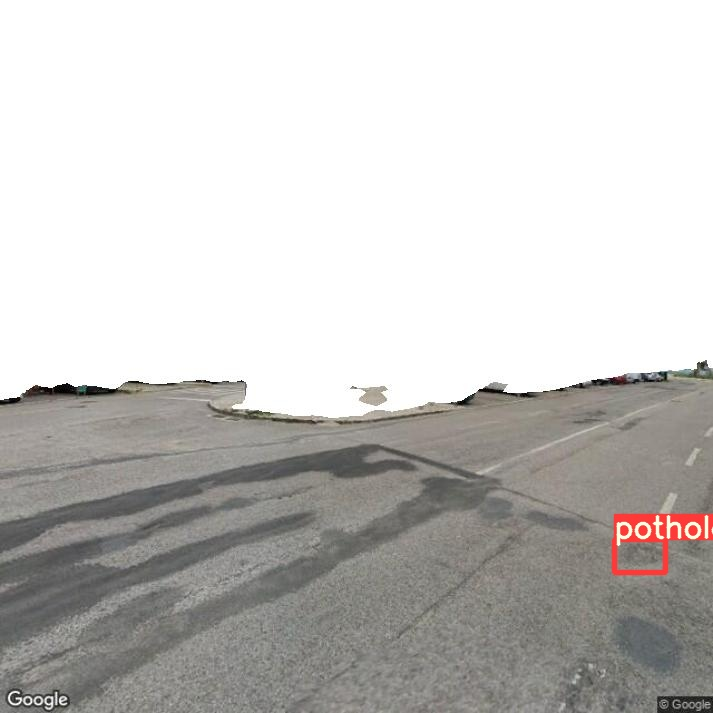

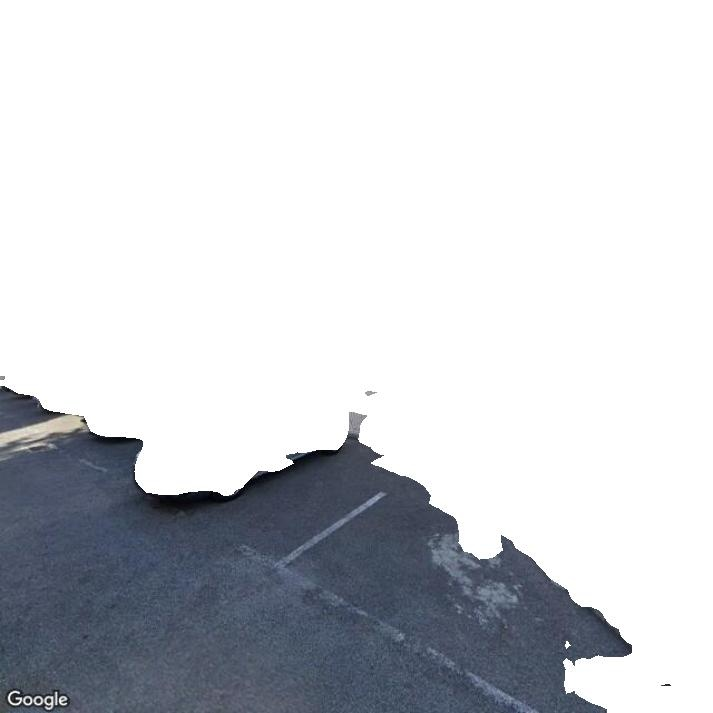

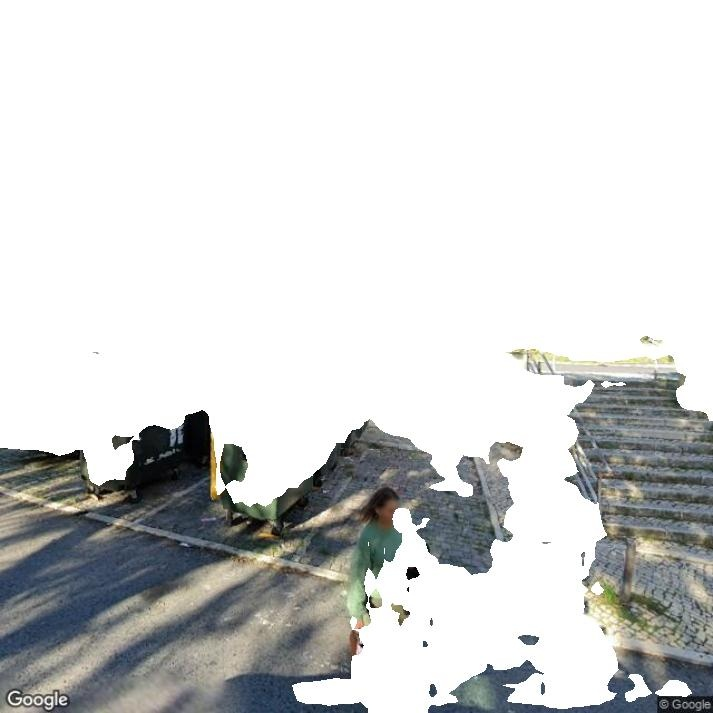

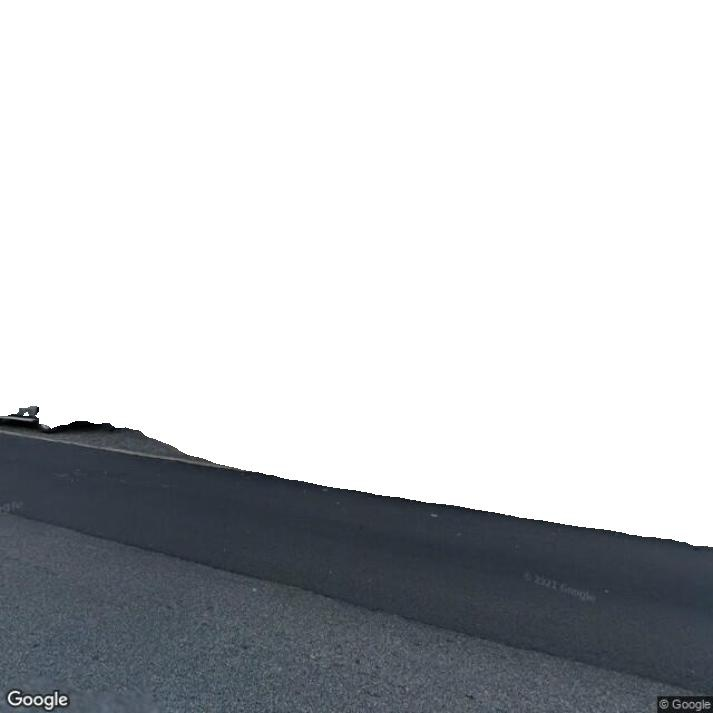

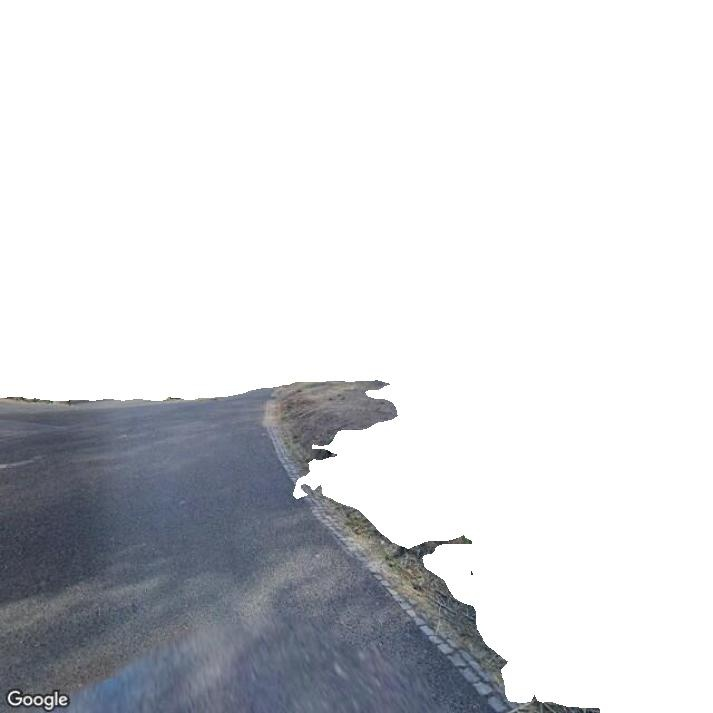

...

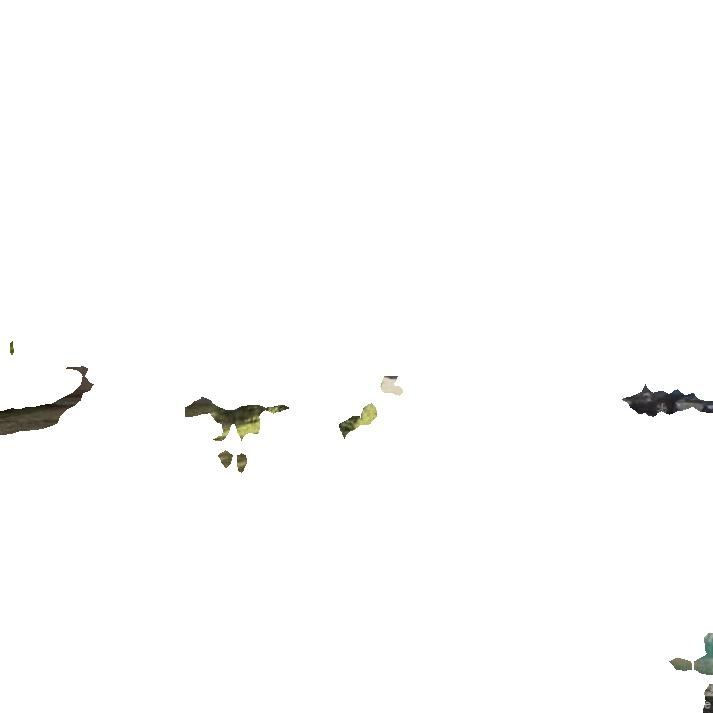

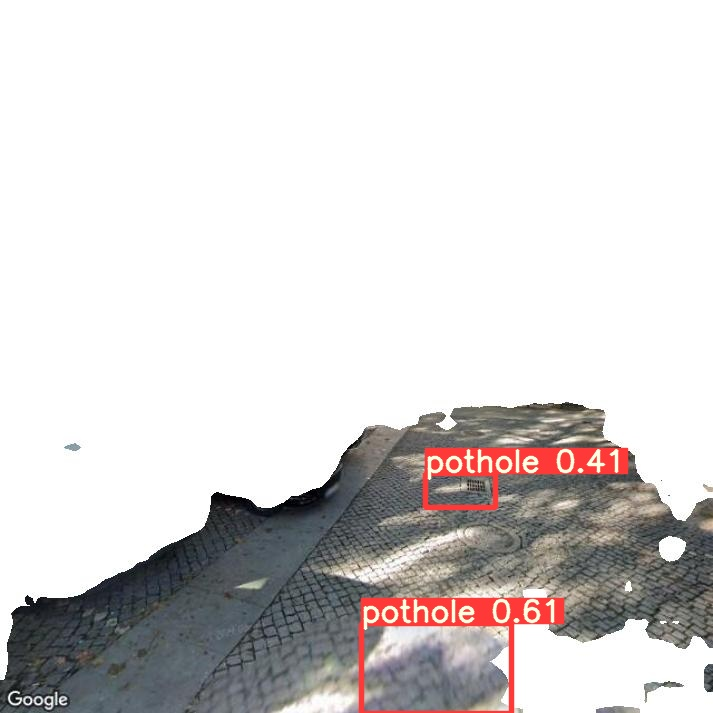

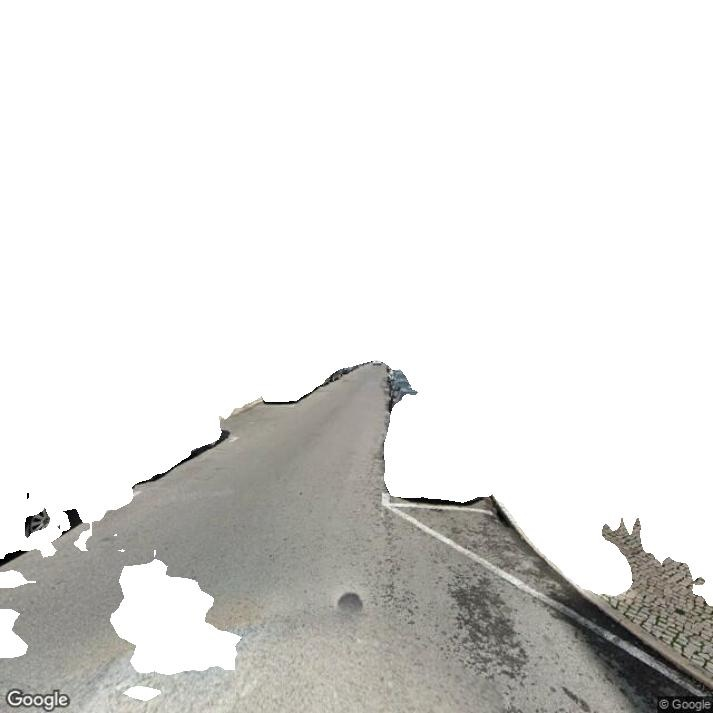

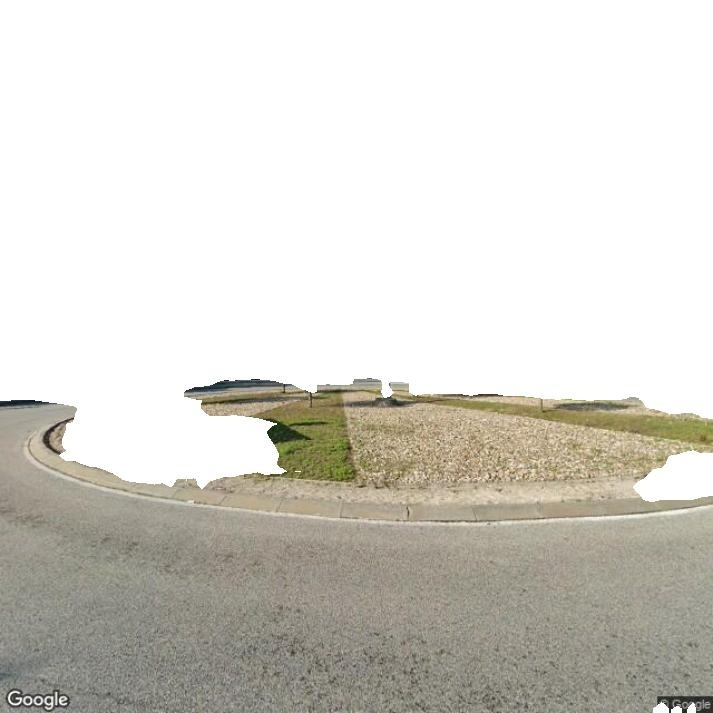

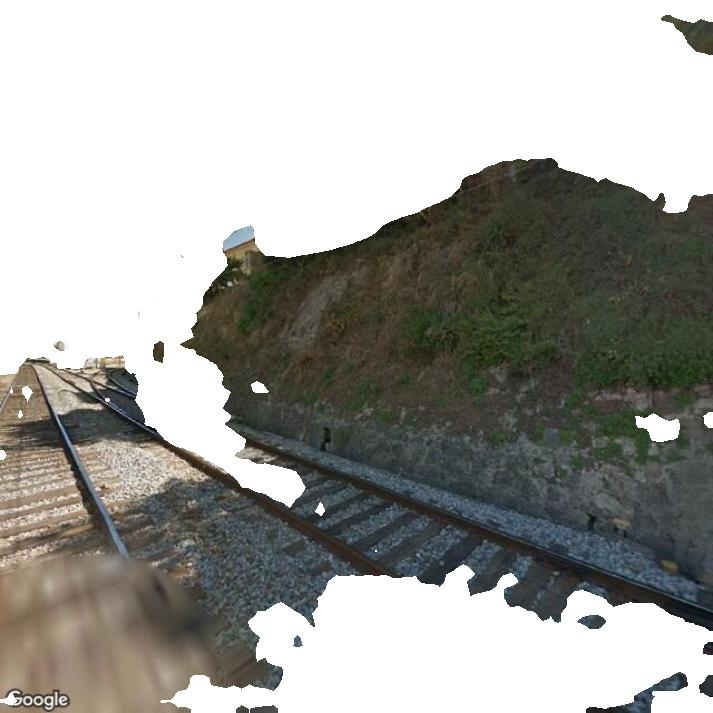

In [16]:
# let's visualize some results

import glob
from IPython.display import Image, display

for imageName in glob.glob('runs/detect/exp/*.jpg')[:100]:
    display(Image(filename=imageName))
    print("\n")

In [18]:
%cd ..

/home/francesco/Documents/wdl/image_set/Competition


In [7]:
# dictionary of labels
potholes = dict()
PATH = os.getcwd()+'/yolov5/runs/detect/exp/labels'   # path of labels 

for lab in tqdm(os.listdir(PATH)):
    labels = []
    with open(PATH+'/'+lab) as f:
        lines = f.readlines()
        lines = [i.replace('\n','') for i in lines]
        for line in lines:
            line =[float(i) for i in line.split(' ')[1:]]
            labels.append(line)
    potholes[lab.replace('.txt', '.jpg')[9:]] = labels

100%|██████████| 2225/2225 [00:00<00:00, 24532.16it/s]


In [8]:
# get the corners coordinates of the rectangles around the potholes

rect_potholes = dict()
for n_image in potholes.keys():
    rect_potholes[n_image] = list()
    for pot in potholes[n_image]:
        X1 = int((pot[0]-pot[2]/2)*713)
        X2 = int((pot[0]+pot[2]/2)*713)
        Y1 = int((pot[1]-pot[-1]/2)*713)
        Y2 = int((pot[1]+pot[-1]/2)*713)
        rect_potholes[n_image].append([[Y2, Y1], [X2, X1]])

## Computation of the risk rate

We would compute the ratio between the area of the rectangle detection of pothole intersacated with the road and the area of the road for each image.
<p>Then we group the images from the same place and we take the maximum of the risk rates. This gives us the risk rate for each place.

In [9]:
# area of the rectangle detector of pothole intersacated with the road

potholes_area = dict()
for n_image in tqdm(potholes.keys()):
    area = 0
    img_segm = cv2.imread(os.getcwd()+'/road_segmentation_images/'+'segmented'+n_image)
    for pot in rect_potholes[n_image]:
        area += (img_segm != 255).all(axis=2)[pot[0][-1]:pot[0][0],pot[1][-1]:pot[1][0]].sum()
    potholes_area[n_image] = area

100%|██████████| 2225/2225 [00:41<00:00, 53.69it/s]


In [10]:
# risk rate for each image
risk_rates = dict()
for img in name_images:
    try:
        risk_rates[img] = potholes_area[img]/road_area[img]
    except:
        risk_rates[img] = 0

In [11]:
# dataframe of lat_long for each place
lat_long = dict()
for coord in os.listdir(os.getcwd() + '/coordinates'):
    with open(os.getcwd()+'/coordinates/'+ coord) as f:
        loc = f.readlines()[0]
        loc = loc.split(';')
        loc[0] = float(loc[0][4:])
        loc[1] = float(loc[1][3:])
        lat_long[coord.replace('.txt','')] = loc

In [12]:
lat_long = pd.DataFrame(lat_long).T
lat_long.columns = ['lat','long']

In [13]:
lat_long.head()

,lat,long
votingImage706,38.770049,-9.148753
votingImage349,38.736552,-9.181897
image933,38.729240,-9.123622
image635,38.776771,-9.176453
votingImage786,38.747560,-9.119965


In [14]:
lat_long['risk_rate'] = 0   # add the risk_rate column

In [15]:
lat_long

,lat,long,risk_rate
votingImage706,38.770049,-9.148753,0
votingImage349,38.736552,-9.181897,0
image933,38.729240,-9.123622,0
image635,38.776771,-9.176453,0
votingImage786,38.747560,-9.119965,0
...,...,...,...
votingImage9,38.742873,-9.123141,0
image123,38.743844,-9.161103,0
votingImage909,38.746942,-9.177112,0
image244,38.780835,-9.139208,0


In [20]:
# group images from the same place (dictionary reference: https://wdl-data.fra1.digitaloceanspaces.com/cycleai/image_set_description.txt)

angles = ['angle0', 'angle90', 'angle180', 'angle270'] 

for place in lat_long.index:
    risk_rate_place = []
    if place[0] == 'v':
        image_plc = [place + angle +'.jpg' for angle in angles[1:]]+[place[6:].lower()+'.jpg']
    else:
        image_plc = [place + angle + '.jpg' for angle in angles]
    for img in image_plc:
        try:
            risk_rate_place.append(risk_rates[img])
        except:
            risk_rate_place.append(0)
    lat_long.loc[place,'risk_rate'] = max(risk_rate_place)

In [21]:
lat_long.head()

,lat,long,risk_rate
votingImage706,38.770049,-9.148753,0.166838
votingImage349,38.736552,-9.181897,0.017223
image933,38.729240,-9.123622,0.000000
image635,38.776771,-9.176453,0.000000
votingImage786,38.747560,-9.119965,0.000000


## Road risk-rate heat map

In [22]:
# import usefull packages
import osmnx as ox
import networkx
import geopandas as gpd

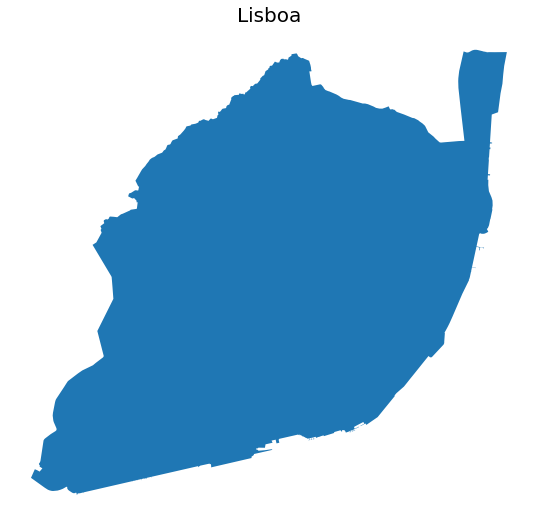

In [23]:
#download from OpenStreatMaps the map of Lisbona

city = ox.geocode_to_gdf('Lisboa, Portugal')
ax = ox.project_gdf(city).plot(figsize=(15,9))
_ = ax.axis('off')
plt.title('Lisboa', size=20)
plt.show()

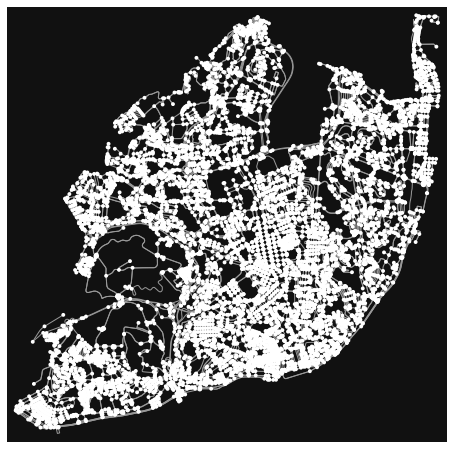

(<Figure size 576x576 with 1 Axes>, <AxesSubplot:>)

In [24]:
#download from OpenStreatMaps the map and roads of Lisbona as graph
G = ox.graph_from_place('Lisboa, Portugal', network_type='drive')
ox.plot_graph(G)

In [25]:
#create, starting from the graph, geodataframes from nodes and edges of Lisbona. Edges=roads
nodes, roads = ox.graph_to_gdfs(G)
roads.head()

osmid  oneway   lanes  \
u        v          key                                          
21270959 413210796  0                 22278074    True       3   
21270962 21270959   0    [22278074, 396719604]    True  [4, 3]   
21270969 412246923  0    [22278381, 410895670]    True       4   
21272087 2688293048 0                396882454   False     NaN   
         21272088   0                396882454   False     NaN   

                                                                name  \
u        v          key                                                
21270959 413210796  0    Avenida General Norton de Matos/2ª Circular   
21270962 21270959   0    Avenida General Norton de Matos/2ª Circular   
21270969 412246923  0    Avenida Marechal Craveiro Lopes/2ª Circular   
21272087 2688293048 0              Rua Professor Reinaldo dos Santos   
         21272088   0              Rua Professor Reinaldo dos Santos   

                             highway maxspeed   length  \
u        v          key                                  
21270959 413210796  0          trunk       80   44.832   
21270962 21270959   0          trunk       80  375.295   
21270969 412246923  0          trunk       80  738.090   
21272087 2688293048 0    residential      NaN   82.536   
         21272088   0    residential      NaN   16.908   

                                                                  geometry  \
u        v          key                                                      
21270959 413210796  0    LINESTRING (-9.16594 38.75732, -9.16646 38.75730)   
21270962 21270959   0    LINESTRING (-9.16173 38.75804, -9.16283 38.757...   
21270969 412246923  0    LINESTRING (-9.13654 38.76321, -9.13828 38.763...   
21272087 2688293048 0    LINESTRING (-9.18838 38.74796, -9.18832 38.748...   
         21272088   0    LINESTRING (-9.18838 38.74796, -9.18840 38.747...   

                        junction bridge  ref tunnel access width  
u        v          key                                           
21270959 413210796  0        NaN    NaN  NaN    NaN    NaN   NaN  
21270962 21270959   0        NaN    NaN  NaN    NaN    NaN   NaN  
21270969 412246923  0        NaN    NaN  NaN    NaN    NaN   NaN  
21272087 2688293048 0        NaN    NaN  NaN    NaN    NaN   NaN  
         21272088   0        NaN    NaN  NaN    NaN    NaN   NaN

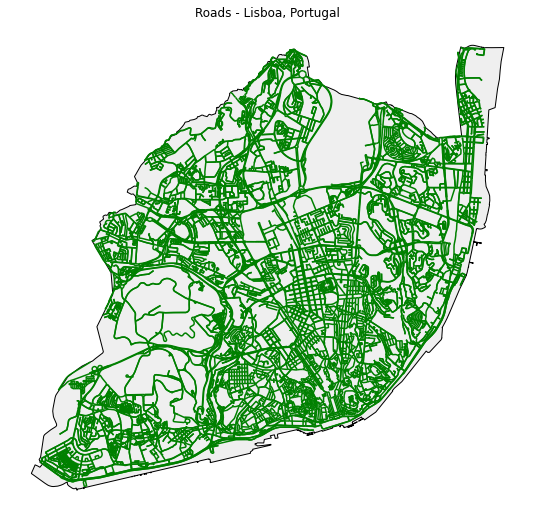

In [26]:
# plot of Lisboa's map with road network
ax = city.plot(figsize=(15,9), color='#EFEFEF', edgecolor='black')
roads.plot(ax=ax, color='green', markersize=0.2)
plt.title("Roads - Lisboa, Portugal");
plt.axis('off');

In [27]:
gdf = gpd.GeoDataFrame(
    lat_long, geometry=gpd.points_from_xy(lat_long.long, lat_long.lat))

In [28]:
gdf.head()

,lat,long,risk_rate,geometry
votingImage706,38.770049,-9.148753,0.166838,POINT (-9.14875 38.77005)
votingImage349,38.736552,-9.181897,0.017223,POINT (-9.18190 38.73655)
image933,38.729240,-9.123622,0.000000,POINT (-9.12362 38.72924)
image635,38.776771,-9.176453,0.000000,POINT (-9.17645 38.77677)
votingImage786,38.747560,-9.119965,0.000000,POINT (-9.11996 38.74756)


Each image, representing a street, is associated with a point in the space. Now we will map each image to an 
object Line, in order to plot an heat map of Lisbon, wrt to the pavement quality of the road.

In [29]:
roads.index=range(len(roads))

In [30]:
roads=roads[['name', 'geometry']]
gdf=gdf[['geometry', 'risk_rate']]
gdf=gdf.set_crs('EPSG:4326')
roads=roads.set_crs('EPSG:4326')

In [31]:
#some roads are associated at more than one obeject Linestring. We are not intrested in the name of the roads but
# each segment, and for later use we need to have an unique name of each Linestring
roads['name']=range(1, len(roads)+1)

In [32]:
#i tranform the object point of an image in a polygon, to merge it with a line. The buffer is needed because the
#geometry of the two datasets is not exactly the same. However, by plotting each of the same separated it can be
#seen that they coinced in reality
meters = 5
buffer = (meters*0.1)/11000  # degrees
gdf2=gdf.copy()
gdf['geometry'] = gdf['geometry'].buffer(buffer)

<ipython-input-32-33d9ae879a81>:7: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gdf['geometry'] = gdf['geometry'].buffer(buffer)


In [33]:
#merge of dataset of images(=roads) and roads
#procedure: if line in polygon, merge
f = gpd.sjoin(roads, gdf, how='inner', op='intersects')
f.head()

,name,geometry,index_right,risk_rate
1,2,"LINESTRING (-9.16173 38.75804, -9.16283 38.757...",votingImage189,0.000000
1,2,"LINESTRING (-9.16173 38.75804, -9.16283 38.757...",votingImage740,0.073059
1,2,"LINESTRING (-9.16173 38.75804, -9.16283 38.757...",votingImage38,0.000000
1,2,"LINESTRING (-9.16173 38.75804, -9.16283 38.757...",votingImage704,0.017601
2,3,"LINESTRING (-9.13654 38.76321, -9.13828 38.763...",votingImage237,0.168350


In [34]:
#group geodataframe by name. 

g = f.groupby('name', as_index=False).max()
g.head()

,name,index_right,risk_rate
0,2,votingImage740,0.073059
1,3,votingImage237,0.168350
2,13,image1497,0.000000
3,14,votingImage114,0.000000
4,17,votingImage863,0.119593


In [35]:
#associate ad roads with no info of pavement index=0

roads2=roads.copy()
roads2['risk_rate']=0
for i in tqdm(range(len(roads))):
    for j in range(len(g)):
        if roads2.loc[i, 'name']== g.loc[j, 'name']:
            roads2.loc[i, 'risk_rate']=g.loc[j, 'risk_rate']

100%|██████████| 20132/20132 [12:32<00:00, 26.76it/s]


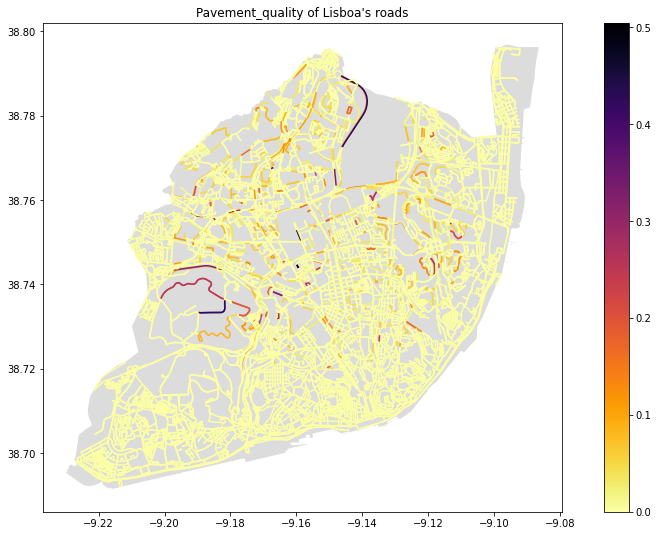

In [37]:
#heat map of pavement_quality of lisboa's roads

fig, ax = plt.subplots(figsize = (15,9)) 
city.plot(ax=ax, color='gainsboro')#, edgecolor='black')
roads2.plot(ax=ax, column='risk_rate', cmap='inferno_r', k=5, legend=True)
plt.title("Pavement_quality of Lisboa's roads");

## Map of Lisbon with an embedded layer of pavement quality using GoogleMaps API

Run the following cells using your Google API keys to visualize an interactive Google HeatMaps 

In [ ]:
!jupyter nbextension enable --py gmaps
!jupyter nbextension enable --py widgetsnbextension

In [ ]:
import gmaps
import gmaps.datasets
gmaps.configure(api_key='INSERT YOUR API KEY HERE')

fig = gmaps.figure()
heatmap_layer = gmaps.heatmap_layer(
    lat_long[['lat', 'long']], weights=lat_long['risk_rate'],
    max_intensity=1, point_radius= 10.0 
)
fig.add_layer(heatmap_layer)
fig

###### screenshot

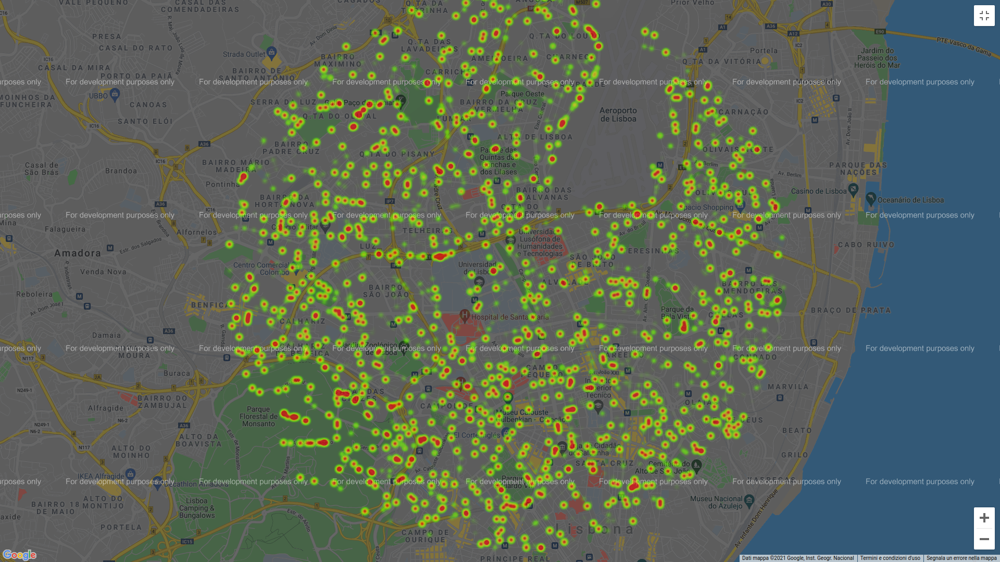

## Conclusions

### Scalability and Impact

The main advantages of our work are the open-sourcing of the data and the reproducibility for every city since they are google street view's photos, and its implementation and improvement is no so costlier since to manually label 3000 images one person took only half of a day. 
By having located the roads of Lisbona in poorer conditions for the cyclists, the authorities can use this information to improve them. This investment has huge and different benefits: better and safer roads could lead to more use of bicycles, and this consequently to less of use of the car, which means fewer accidents and pollution. The city, after having repaired the streets, to encourage the use of green means of transport, could discount them. 

### Future Work

With other risk-related data of the roads (such as the type of pavement), other than the potholes, we would have a more complete general framework of the condition of the roads.
Moreover, with data of bike accidents per road - maybe with weather and time of the day- we could join what we have done in the previous stage (road accidents risk detector), with what we have done now. By doing so, we would build a robust detector that identifies the condition and dangerousness of a road.